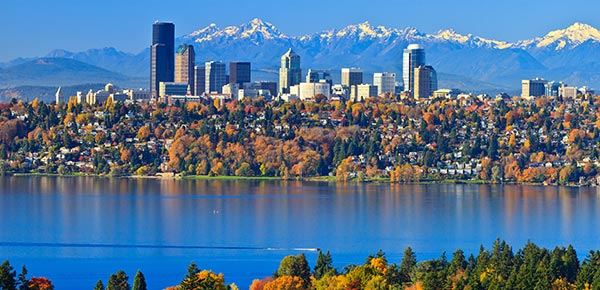

# Cohabitational Housing for Single Mother's in King’s County, WA
### Data Analysis for CoAbode.org
<br>
<br>
Ash Heinke and Aidan O'Keefe

## Overview

We have been brought in by our client, CoAbode.org, in order to help them find suitable housing for their customers, single mothers who are looking to cohabitate. We have taken housing data from a specified test area, King County, WA, to determine which factors are most important when projecting housing price, so we could evaluate whether the factors these families are looking for are attainable within the pricing range's they can afford.


## Business Problem

Our stakeholders are CoAbode, a social networking service that matches single mothers who are interested in co-habitating in order to share their financial, parental, and time responsibiities. 

According to 2022 U.S. Census Bureau data, out of about 11 million single parent families with children under the age of 18, nearly 80 percent were headed by single mothers. Almost 25% of those single-mother families were food insecure and a single mother spends about 40% of her yearly income JUST on childcare. Some staggering statistics that could be remedied by a cohabitual living stituation.

CoAbode has the connective resources to match people, but lack the resources to match those people with homes that fall within their respective budgets. We are taking a test area in Washingtom state to analyze housing prices, and the factors that come into play in regards to the cost of housing in this particular area, in the hopes of finding appropriate family homes within their customers budget. If it is successful, we hope to help them launch a similar model across ther whole territory, which spans across the US and Canada.

We would like to help them expand their range of services so that they can become a one-stop-shop for single mothers looking for co-habitation, as well as other demographic groups in the future as they grow their offerings.

# Exploratory Data Analysis

## Data Understanding

We are utilizing two different data sets for this project. A King County house sales data set, which comes from the King County governement website. We have also pulled report card data by school and school district for King County for 2021-2022 from https://data.wa.gov/.
 
The initial data set represents individual homes within King County, including information such as price, square footage, address, etc. The report card data includes a breakdown of scores by student demographic for each school in King County.
 
Our target variable is price, as we are trying to predict the value of homes that include the certain specifications that their customers are looking for or need, that as well fall within their budget range.

To achieve this we are running our topline models using most of the variables within the dataset, as well as some additional parameters that were brought in with the addtion of our report card dataset. Once this data is modeled, we plan on shifting our focus to just houses including four bedrooms or more (to accommodate two single parents and their kids), houses that are in a quiet neighborhood, that are in a good school district, and that are affordable.

In [1]:
#Import libraries
# Standard Packages
import pandas as pd
import numpy as np

# Viz Packages
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import plotly.express as px

# Scipy Stats
import scipy.stats as stats 

# Statsmodel Api
import statsmodels.api as sm
from statsmodels.formula.api import ols

# SKLearn Modules
from sklearn.linear_model import LinearRegression
from sklearn.feature_selection import RFE
from sklearn.preprocessing import StandardScaler, OrdinalEncoder, OneHotEncoder
from sklearn.model_selection import train_test_split
import sklearn.metrics as metrics

# Suppress future and deprecation warnings
import warnings
warnings.filterwarnings("ignore", category= FutureWarning)
warnings.filterwarnings("ignore", category=DeprecationWarning) 

#Display Full Dataframe width
pd.options.display.max_columns = None
pd.options.display.width = None

## Importing Datasets

### House Sales Dataset

This data is a dataset of house sales in King County, Washington. The dictionary below explains the meaning of each column.

* `id` - Unique identifier for a house
* `date` - Date house was sold
* `price` - Sale price (prediction target)
* `bedrooms` - Number of bedrooms
* `bathrooms` - Number of bathrooms
* `sqft_living` - Square footage of living space in the home
* `sqft_lot` - Square footage of the lot
* `floors` - Number of floors (levels) in house
* `waterfront` - Whether the house is on a waterfront
  * Includes Duwamish, Elliott Bay, Puget Sound, Lake Union, Ship Canal, Lake Washington, Lake Sammamish, other lake, and river/slough waterfronts
* `greenbelt` - Whether the house is adjacent to a green belt
* `nuisance` - Whether the house has traffic noise or other recorded nuisances
* `view` - Quality of view from house
  * Includes views of Mt. Rainier, Olympics, Cascades, Territorial, Seattle Skyline, Puget Sound, Lake Washington, Lake Sammamish, small lake / river / creek, and other
* `condition` - How good the overall condition of the house is. Related to maintenance of house.
  * See the [King County Assessor Website](https://info.kingcounty.gov/assessor/esales/Glossary.aspx?type=r) for further explanation of each condition code
* `grade` - Overall grade of the house. Related to the construction and design of the house.
  * See the [King County Assessor Website](https://info.kingcounty.gov/assessor/esales/Glossary.aspx?type=r) for further explanation of each building grade code
* `heat_source` - Heat source for the house
* `sewer_system` - Sewer system for the house
* `sqft_above` - Square footage of house apart from basement
* `sqft_basement` - Square footage of the basement
* `sqft_garage` - Square footage of garage space
* `sqft_patio` - Square footage of outdoor porch or deck space
* `yr_built` - Year when house was built
* `yr_renovated` - Year when house was renovated
* `address` - The street address
* `lat` - Latitude coordinate
* `long` - Longitude coordinate

In [2]:
#Import house sales data
kc_house_df = pd.read_csv('/Users/Aidan/Documents/Flatiron/Phase_2/Phase_2_Project/King-County-House-Sales-/data/kc_house_data.csv')

#Looking at first 5 rows
kc_house_df.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,greenbelt,nuisance,view,condition,grade,heat_source,sewer_system,sqft_above,sqft_basement,sqft_garage,sqft_patio,yr_built,yr_renovated,address,lat,long
0,7399300360,5/24/2022,675000.0,4,1.0,1180,7140,1.0,NO,NO,NO,NONE,Good,7 Average,Gas,PUBLIC,1180,0,0,40,1969,0,"2102 Southeast 21st Court, Renton, Washington ...",47.461975,-122.19052
1,8910500230,12/13/2021,920000.0,5,2.5,2770,6703,1.0,NO,NO,YES,AVERAGE,Average,7 Average,Oil,PUBLIC,1570,1570,0,240,1950,0,"11231 Greenwood Avenue North, Seattle, Washing...",47.711525,-122.35591
2,1180000275,9/29/2021,311000.0,6,2.0,2880,6156,1.0,NO,NO,NO,AVERAGE,Average,7 Average,Gas,PUBLIC,1580,1580,0,0,1956,0,"8504 South 113th Street, Seattle, Washington 9...",47.502045,-122.22520
3,1604601802,12/14/2021,775000.0,3,3.0,2160,1400,2.0,NO,NO,NO,AVERAGE,Average,9 Better,Gas,PUBLIC,1090,1070,200,270,2010,0,"4079 Letitia Avenue South, Seattle, Washington...",47.566110,-122.29020
4,8562780790,8/24/2021,592500.0,2,2.0,1120,758,2.0,NO,NO,YES,NONE,Average,7 Average,Electricity,PUBLIC,1120,550,550,30,2012,0,"2193 Northwest Talus Drive, Issaquah, Washingt...",47.532470,-122.07188


In [3]:
#Let's look at numeric summary of the data
kc_house_df.describe()

,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,sqft_above,sqft_basement,sqft_garage,sqft_patio,yr_built,yr_renovated,lat,long
count,3.015500e+04,3.015500e+04,30155.000000,30155.000000,30155.000000,3.015500e+04,30155.000000,30155.000000,30155.000000,30155.000000,30155.000000,30155.000000,30155.000000,30155.000000,30155.000000
mean,4.538104e+09,1.108536e+06,3.413530,2.334737,2112.424739,1.672360e+04,1.543492,1809.826098,476.039396,330.211142,217.412038,1975.163953,90.922301,47.328076,-121.317397
std,2.882587e+09,8.963857e+05,0.981612,0.889556,974.044318,6.038260e+04,0.567717,878.306131,579.631302,285.770536,245.302792,32.067362,416.473038,1.434005,5.725475
min,1.000055e+06,2.736000e+04,0.000000,0.000000,3.000000,4.020000e+02,1.000000,2.000000,0.000000,0.000000,0.000000,1900.000000,0.000000,21.274240,-157.791480
25%,2.064175e+09,6.480000e+05,3.000000,2.000000,1420.000000,4.850000e+03,1.000000,1180.000000,0.000000,0.000000,40.000000,1953.000000,0.000000,47.405320,-122.326045
50%,3.874011e+09,8.600000e+05,3.000000,2.500000,1920.000000,7.480000e+03,1.500000,1560.000000,0.000000,400.000000,150.000000,1977.000000,0.000000,47.551380,-122.225585
75%,7.287100e+09,1.300000e+06,4.000000,3.000000,2619.500000,1.057900e+04,2.000000,2270.000000,940.000000,510.000000,320.000000,2003.000000,0.000000,47.669913,-122.116205
max,9.904000e+09,3.075000e+07,13.000000,10.500000,15360.000000,3.253932e+06,4.000000,12660.000000,8020.000000,3580.000000,4370.000000,2022.000000,2022.000000,64.824070,-70.074340


It seems we have some strange values in our set- a house with 0 `bedrooms` or `bathrooms` (this could be a placeholder) as well as a `sqft_living` space with a value of 3 feet. <br>
<br>
Our `yr_renovated` column does not seem very helpful as it only has homes renovated in 2022.<br>
<br>
These will be values we deal with when we prepare the data. 

In [4]:
#Looking at how many records and features we have
kc_house_df.shape 
# 30155 rows, 25 columns/features

(30155, 25)

In [5]:
#Look at column names and datatypes
kc_house_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30155 entries, 0 to 30154
Data columns (total 25 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             30155 non-null  int64  
 1   date           30155 non-null  object 
 2   price          30155 non-null  float64
 3   bedrooms       30155 non-null  int64  
 4   bathrooms      30155 non-null  float64
 5   sqft_living    30155 non-null  int64  
 6   sqft_lot       30155 non-null  int64  
 7   floors         30155 non-null  float64
 8   waterfront     30155 non-null  object 
 9   greenbelt      30155 non-null  object 
 10  nuisance       30155 non-null  object 
 11  view           30155 non-null  object 
 12  condition      30155 non-null  object 
 13  grade          30155 non-null  object 
 14  heat_source    30123 non-null  object 
 15  sewer_system   30141 non-null  object 
 16  sqft_above     30155 non-null  int64  
 17  sqft_basement  30155 non-null  int64  
 18  sqft_g

It looks like our features are a mix of numeric values and strings. We will have to separate those later for modeling.

It also looks like we have some missing values in `heat_source` and `sewer_system`. We will have to deal with these later.

In [6]:
#Looking at first 5 rows of missing values for the sewer_system column.
kc_house_df[kc_house_df['sewer_system'].isna()].head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,greenbelt,nuisance,view,condition,grade,heat_source,sewer_system,sqft_above,sqft_basement,sqft_garage,sqft_patio,yr_built,yr_renovated,address,lat,long
759,724069123,12/1/2021,2925000.0,5,4.5,4670,8147,2.0,YES,NO,NO,EXCELLENT,Average,10 Very Good,Gas,NaN,4670,0,860,120,2021,0,"2649 East Lake Sammamish Parkway Southeast, Sa...",47.585570,-122.084370
905,3225069328,8/25/2021,2500000.0,5,4.5,4200,14836,2.0,NO,NO,NO,NONE,Average,9 Better,Gas,NaN,4200,0,650,90,2021,0,"19806 Southeast 8th Street, Sammamish, Washing...",47.602385,-122.075195
7944,9485700113,4/25/2022,800000.0,3,3.0,1850,1421,2.0,NO,NO,NO,NONE,Average,8 Good,Electricity,NaN,1440,410,0,300,2022,0,"8424 24th Avenue Southwest, Seattle, Washingto...",47.527487,-122.363185
8329,7462900153,12/12/2021,300000.0,4,3.5,3230,72454,2.0,NO,NO,YES,NONE,Average,8 Good,Gas,NaN,3230,0,700,480,2022,0,"Southeast 104th Street, North Bend, Washington...",47.506180,-121.765180
9655,3330500334,11/24/2021,699000.0,3,2.0,1340,868,2.0,NO,NO,NO,NONE,Average,8 Good,Electricity,NaN,870,470,0,460,2019,0,"4207 S Brandon St, Seattle, Washington 98118, ...",47.553320,-122.280200


In [7]:
#Look at 1st record's address to see what it includes
kc_house_df['address'][0]

'2102 Southeast 21st Court, Renton, Washington 98055, United States'

We have the city and zip code which could be useful as a separate feature later.

In [8]:
#Look at nuisance as this could be a valuable feature for our stakeholder
kc_house_df['nuisance'].value_counts(normalize=True)

NO     0.825502
YES    0.174498
Name: nuisance, dtype: float64

The majority (82.5%) of homes in King County do not have any sort of nuisance (defined as traffic noise or other recorded nuisances). This is a good sign for families looking for quiet neighborhoods.

Let's visually inspect our data

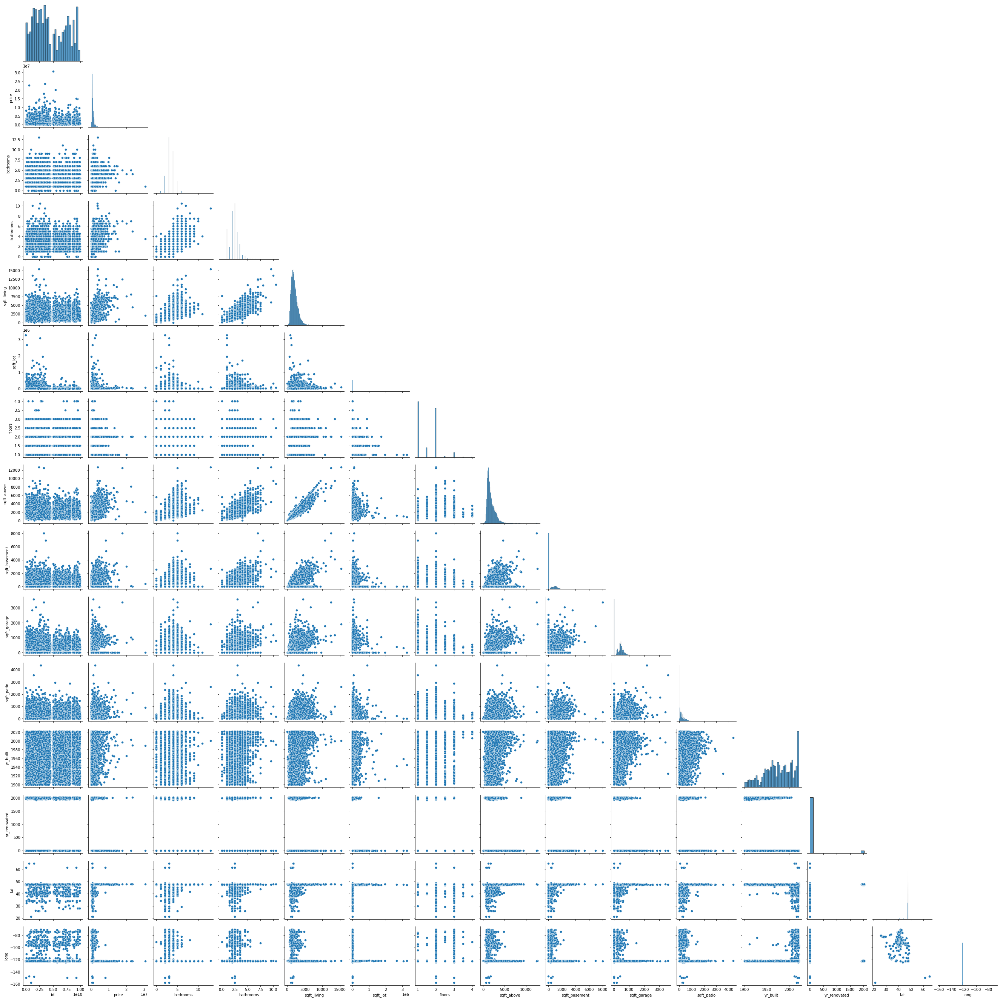

In [9]:
#Pariplot of dataframe
sns.pairplot(kc_house_df, corner=True)

Although the number of features graphed in this pairplot is overwhelming, it does provide some interesting insights. We can see that a majority of the features are skewed to the right (`price`, `bathrooms`, `sqft_living`, `sqft_above`, `sqft_garage`,`sqft_patio`) while `yr_built` is most obviously skewed to the left.

We can also see the relationship `price` has with other variables. It seemed to be positively correlated with `sqft_living`, `sqft_above`, `bedrooms`, and `bathrooms`.

Let's look more closely at our `price` distribution

In [10]:
#Histogram of price variable
px.histogram(data_frame = kc_house_df, x = 'price',\
             labels={'price':"House Sale Price"},
             title="Distribution of House Sale Prices in King County, WA")

As we can see, `price` has a large number of outliers. We will have to standardize this data to have a normal distribution to model.

Let's also look at what seemed to be one of our strongest positive correlations with `price` and `sqft_living`.

In [11]:
#Scatterplot of price and sqft_living
px.scatter(data_frame = kc_house_df, x= 'sqft_living', y = 'price',\
           trendline = 'ols',trendline_color_override = 'red',\
           labels={'sqft_living':'Square Foot Living Area', 'price':"House Sale Price"},\
           title="Relationship between Living Area Sqaure Footage and House Sale Prices")

### School District Dataset

This dataset is from https://data.wa.gov/ and is a 2021-2022 report card brekadown of public school standardized test scores grouped by student demographic for schools in the entirety of Washington state. The columns are defined by the dictionary below:

* `SchoolYear` - 6 character year displayed as YYYY-YY (e.g., 2019-20)
* `OrganizationLevel` - The level at which the data is aggregated.  Allowable values = School, District, County, and State.
* `County` - County Name in which the school or district resides. When OrganizationLevel = "State", this field will be reported as "Multiple"
* `ESDName` - Name the the Educational Service District serving the district or school. When OrganizationLevel = "State", this field will be NULL
* `ESDOrganizationID` - Unique ESD Identification number. When OrganizationLevel = "State", this field  will be NULL
* `DistrictCode` - Unique district code. When OrganizationLevel = "State", this field  will be NULL
* `DistrictName` - District name. When OrganizationLevel = "State", this field  will be NULL
* `DistrictOrganizationId` - Unique district identification number. When OrganizationLevel = "State", this field  will be NULL
* `SchoolCode` - Unique school code. When OrganizationLevel = "State" or "District", this field  will be NULL
* `SchoolName` - School name. When OrganizationLevel = "State" or "District", this field  will be NULL
* `SchoolOrganizationid` - Unique school identification number. When OrganizationLevel = "State" or "District", this field  will be NULL
* `CurrentSchoolType` - School type code, please see https://eds.ospi.k12.wa.us/DirectoryEDS.aspx for more on school type codes
* `StudentGroupType` - This field describes the student group type being measured: Gender, Race/ethnicity, and student characteristic groups like low income, English Language Learners, and students with disabilities. 
* `StudentGroup` - This field describes the students by parsing out the Specific StudentGroupType into their subgroups: such as Male, Female, and Gender X, or Non Low-income and Low Income student groups. 
* `GradeLevel` - Designates grade of students, "All Grades" identifies rows in which all students were counted (regardless of Grade)
* `Subject` - This field indactes if the data in the following columns is specific to ELA data or Math data.
* `Suppression` - This describes if the data has been suppresssed in accordance with our suppression guidelines. For more information about our suppression methods please see: https://www.k12.wa.us/data-reporting/protecting-student-privacy
* `MedianSGP` - The median SGP for the indicated row of data. In cases of suppression field will be blank
* `StudentCount` - Unique count of students with a growth calculation. In cases of suppression field will be blank.
* `NumberLowGrowth` - Unique count of students that had growth percentiles placing them in the bottom 1/3 of the state. In cases of suppression field will be blank.
* `NumberTypicalGrowth` - Unique count of students that had growth percentiles placing them above the bottom 1/3 but below the top 1/3 of thunique count of students that had growth percentiles placing them in the top 1/3 of the state. In cases of suppression field will be blank.
* `PercentLowGrowth` - Percent of students that had growth percentiles placing them in the bottom 1/3 of the state. In cases of suppression field will be blank.
* `PercentTypicalGrowth` - Percent of students that had growth percentiles placing them above the bottom 1/3 but below the top 1/3 of the state. In cases of suppression field will be blank.
* `PercentHighGrowth` - Percent of students that had growth percentiles placing them in the top 1/3 of the state. In cases of suppression field will be blank.
* `DataAsOf` - Date the file was last updated

In [12]:
#Import School Districts dataset
schools_df = pd.read_csv('/Users/Aidan/Documents/Flatiron/Phase_2/Phase_2_Project/King-County-House-Sales-/data/Report_Card_Assessment_Data_2021-22_School_Year.csv')

#Preview the first 5 rows
schools_df.head()

/Users/Aidan/opt/anaconda3/envs/learn-env/lib/python3.8/site-packages/IPython/core/interactiveshell.py:3145: DtypeWarning:

Columns (11) have mixed types.Specify dtype option on import or set low_memory=False.



,SchoolYear,OrganizationLevel,County,ESDName,ESDOrganizationId,DistrictCode,DistrictName,DistrictOrganizationId,SchoolCode,SchoolName,SchoolOrganizationId,CurrentSchoolType,StudentGroupType,StudentGroup,GradeLevel,TestAdministration,TestSubject,Suppression,Count of Students Expected to Test,Count of students expected to test including previously passed,CountMetStandard,PercentMetStandard,PercentLevel1,PercentLevel2,PercentLevel3,PercentLevel4,PercentMetTestedOnly,PercentNoScore,DataAsOf
0,2021-22,District,Grays Harbor,Capital Region ESD 113,100004.0,14005.0,Aberdeen School District,100010.0,NaN,District Total,NaN,NaN,FRL,Low-Income,04,SBAC,ELA,None,176.0,176.0,54.0,30.7%,0.460227,0.221591,0.198864,0.107955,0.310345,0.011364,9/7/2022
1,2021-22,District,Grays Harbor,Capital Region ESD 113,100004.0,14005.0,Aberdeen School District,100010.0,NaN,District Total,NaN,NaN,Gender,Female,04,SBAC,ELA,None,107.0,107.0,35.0,32.7%,0.420561,0.224299,0.196262,0.130841,0.336538,0.028037,9/7/2022
2,2021-22,District,Grays Harbor,Capital Region ESD 113,100004.0,14005.0,Aberdeen School District,100010.0,NaN,District Total,NaN,NaN,Gender,Male,04,SBAC,ELA,None,111.0,111.0,39.0,35.1%,0.441441,0.198198,0.198198,0.153153,0.354545,0.009009,9/7/2022
3,2021-22,District,Grays Harbor,Capital Region ESD 113,100004.0,14005.0,Aberdeen School District,100010.0,NaN,District Total,NaN,NaN,homeless,Homeless,04,SBAC,ELA,N<10,NaN,NaN,NaN,Suppressed: N<10,NaN,NaN,NaN,NaN,NaN,NaN,9/7/2022
4,2021-22,District,Grays Harbor,Capital Region ESD 113,100004.0,14005.0,Aberdeen School District,100010.0,NaN,District Total,NaN,NaN,Migrant,Migrant,04,SBAC,ELA,N<10,NaN,NaN,NaN,Suppressed: N<10,NaN,NaN,NaN,NaN,NaN,NaN,9/7/2022


In [13]:
#Create a new subset of just the King County Schools
king_school_df = schools_df[schools_df.County == "King"].copy()

# Preview our new subset
king_school_df.head()

,SchoolYear,OrganizationLevel,County,ESDName,ESDOrganizationId,DistrictCode,DistrictName,DistrictOrganizationId,SchoolCode,SchoolName,SchoolOrganizationId,CurrentSchoolType,StudentGroupType,StudentGroup,GradeLevel,TestAdministration,TestSubject,Suppression,Count of Students Expected to Test,Count of students expected to test including previously passed,CountMetStandard,PercentMetStandard,PercentLevel1,PercentLevel2,PercentLevel3,PercentLevel4,PercentMetTestedOnly,PercentNoScore,DataAsOf
311,2021-22,District,King,Puget Sound Educational Service District 121,100006.0,17408.0,Auburn School District,100016.0,NaN,District Total,NaN,NaN,All,All Students,05,SBAC,ELA,None,1234.0,1234.0,582.0,47.2%,0.306321,0.188817,0.260940,0.210697,0.487846,0.033225,9/7/2022
312,2021-22,District,King,Puget Sound Educational Service District 121,100006.0,17408.0,Auburn School District,100016.0,NaN,District Total,NaN,NaN,ELL,English Language Learners,05,SBAC,ELA,None,299.0,299.0,46.0,15.4%,0.632107,0.180602,0.140468,0.013378,0.159170,0.033445,9/7/2022
313,2021-22,District,King,Puget Sound Educational Service District 121,100006.0,17408.0,Auburn School District,100016.0,NaN,District Total,NaN,NaN,ELL,Non-English Language Learners,05,SBAC,ELA,None,935.0,935.0,536.0,57.3%,0.202139,0.191444,0.299465,0.273797,0.592920,0.033155,9/7/2022
314,2021-22,District,King,Puget Sound Educational Service District 121,100006.0,17408.0,Auburn School District,100016.0,NaN,District Total,NaN,NaN,Foster,Foster Care,05,SBAC,ELA,N<10,NaN,NaN,NaN,Suppressed: N<10,NaN,NaN,NaN,NaN,NaN,NaN,9/7/2022
315,2021-22,District,King,Puget Sound Educational Service District 121,100006.0,17408.0,Auburn School District,100016.0,NaN,District Total,NaN,NaN,FRL,Non-Low Income,05,SBAC,ELA,None,407.0,407.0,271.0,66.6%,0.144963,0.144963,0.307125,0.358722,0.696658,0.044226,9/7/2022


In [14]:
#Look at how many records and features we have in our subset
king_school_df.shape
#146319 records, 29 columns/features

(146319, 29)

In [15]:
#Look at column names to see how we can connect this dataset with our House Sales data
king_school_df.columns

Index(['SchoolYear', 'OrganizationLevel', 'County', 'ESDName',
       'ESDOrganizationId', 'DistrictCode', 'DistrictName',
       'DistrictOrganizationId', 'SchoolCode', 'SchoolName',
       'SchoolOrganizationId', 'CurrentSchoolType', 'StudentGroupType',
       'StudentGroup', 'GradeLevel', 'TestAdministration', 'TestSubject',
       'Suppression', 'Count of Students Expected to Test',
       'Count of students expected to test including previously passed',
       'CountMetStandard', 'PercentMetStandard', 'PercentLevel1',
       'PercentLevel2', 'PercentLevel3', 'PercentLevel4',
       'PercentMetTestedOnly', 'PercentNoScore', 'DataAsOf'],
      dtype='object')

In [16]:
#Look at the school districts in our King County subset
king_school_df.DistrictName.value_counts()

Seattle School District No. 1              27136
Lake Washington School District            14470
Kent School District                       12693
Federal Way School District                12013
Highline School District                    9768
Northshore School District                  9572
Renton School District                      9106
Bellevue School District                    8219
Auburn School District                      8216
Issaquah School District                    7862
Shoreline School District                   5097
Snoqualmie Valley School District           4148
Tahoma School District                      3478
Enumclaw School District                    3264
Tukwila School District                     2342
Riverview School District                   2162
Mercer Island School District               1849
Vashon Island School District               1528
Rainier Prep Charter School District         698
Summit Public School: Atlas                  592
Skykomish School Dis

If we know what cities or zip codes are included in each school district then we could map each house to its approproate district.

# Data Preparation and Cleaning 


Upon exloring the house sales data, there were a few matters that we needed to address. We had a duplicate account, which we dropped, as well as about 40 null variables from our heat source and sewer type columns that we removed, resulting in a loss of 44 rows. We also split our address column, to create a separate zip code column, which we plan to use for when we pull in our other dataset of school district test scores.

We had some missing values, as the column_names.md file that accompanied the House Sales dataset stated "In some cases due to missing or incorrectly-entered data from the King County Assessor, this API returned locations outside of King County, WA." This meant that we needed to remove houses from our dataset that are not in King County, WA. We pulled zip code information for the county from https://statisticalatlas.com/county/Washington/King-County/Overview and compiled King County zip codes into a list to use to subset data frame for only houses that have a zip code in King_County_WA_zipcodes. Once completing this we found that we needed to remove the data of 69 homes.

Also, we found that technically Fife School District is in both Pierce and King counties. In the `schools_df` it is listed as being in Pierce County, but we have decided to include it so that the King County houses with zip codes corresponding to the Fife School District will be included in our overall dataset.

Our school dataset also included some college's and charter school's that are not specific school districts, so we dropped this data in order to account for school districts in King County specifically. As well, we only care about the overall scores of each school district, not the scores of each demographic, so we subset our dataframe for district totals for 'All Students' and 'All Grades'. Once we had done this, we noticed that each district had two scores for each test subject. These duplicates seemed to happen because of different tests or groups. By researching the Test Administration, we found that the AIM Scores are for kids with cognitive disabilities and that this group has far fewer students in their count than the others. So, we decided to separate these scores and use just the non-AIM scores (SBAC and WCAS) for our overall rating of a school district, as these contained a higher count of students and was more statistcally significant to our dataset. Lastly, for comparison purposes, we created another column with the overall district test score called `District Test Score` which averaged the scores between Math, English, and Science for each school district.

After we finished cleaning and preparing both datasets, we joined them by `DistrictName` so that every house has a column with it's appropriate school district, for which you can see the average scores for that district.

We felt that these decisions were appropriate based on the data and our business direction, as we wanted to make sure that we weren't accounting for data on homes that fell outside of the county we are analyzing. As well, if a home didn't account for a power source of sewer system, we felt that it was appropriate to drop, as the families we are modeling for need a fully funtioning house that is ready to go. And lastly when it came to the test score dataset, we wanted to make our initial model off the largest group of students to support our model. For the future we can potentially look int these different testing groups (AIM, SBAC, and WCAS) to see how each of their test scores affect the data.

### House Sales Dataset

In [17]:
#Rename house sales data
kc_family_house_df = kc_house_df

#Reset the index
kc_family_house_df.reset_index(drop=True,inplace= True)

#Preview first 5 rows of subset
kc_family_house_df.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,greenbelt,nuisance,view,condition,grade,heat_source,sewer_system,sqft_above,sqft_basement,sqft_garage,sqft_patio,yr_built,yr_renovated,address,lat,long
0,7399300360,5/24/2022,675000.0,4,1.0,1180,7140,1.0,NO,NO,NO,NONE,Good,7 Average,Gas,PUBLIC,1180,0,0,40,1969,0,"2102 Southeast 21st Court, Renton, Washington ...",47.461975,-122.19052
1,8910500230,12/13/2021,920000.0,5,2.5,2770,6703,1.0,NO,NO,YES,AVERAGE,Average,7 Average,Oil,PUBLIC,1570,1570,0,240,1950,0,"11231 Greenwood Avenue North, Seattle, Washing...",47.711525,-122.35591
2,1180000275,9/29/2021,311000.0,6,2.0,2880,6156,1.0,NO,NO,NO,AVERAGE,Average,7 Average,Gas,PUBLIC,1580,1580,0,0,1956,0,"8504 South 113th Street, Seattle, Washington 9...",47.502045,-122.22520
3,1604601802,12/14/2021,775000.0,3,3.0,2160,1400,2.0,NO,NO,NO,AVERAGE,Average,9 Better,Gas,PUBLIC,1090,1070,200,270,2010,0,"4079 Letitia Avenue South, Seattle, Washington...",47.566110,-122.29020
4,8562780790,8/24/2021,592500.0,2,2.0,1120,758,2.0,NO,NO,YES,NONE,Average,7 Average,Electricity,PUBLIC,1120,550,550,30,2012,0,"2193 Northwest Talus Drive, Issaquah, Washingt...",47.532470,-122.07188


#### Remove Duplicates

In [18]:
#Look for any duplicates in our dataset
kc_family_house_df.duplicated().value_counts()

False    30154
True         1
dtype: int64

Looks like there is a single duplicate to address.

In [19]:
# Dropping the duplicate row
kc_family_house_df.drop_duplicates(keep='first', inplace =True)

In [20]:
#Shape of dataframe (rows, columns)
kc_family_house_df.shape

(30154, 25)

#### Dealing with Missing Values

In [21]:
#View any null values in our data
kc_family_house_df.isna().sum()

id                0
date              0
price             0
bedrooms          0
bathrooms         0
sqft_living       0
sqft_lot          0
floors            0
waterfront        0
greenbelt         0
nuisance          0
view              0
condition         0
grade             0
heat_source      32
sewer_system     14
sqft_above        0
sqft_basement     0
sqft_garage       0
sqft_patio        0
yr_built          0
yr_renovated      0
address           0
lat               0
long              0
dtype: int64

In [22]:
# Dropping any rows with null values since only 46 values out of 30,000+ rows are missing values
kc_family_house_df.dropna(inplace=True)

In [23]:
#Shape of dataframe after dropping records with missing values and columns we don't need
kc_family_house_df.shape

(30110, 25)

Looks like we only dropped 44 rows 

#### Adding Features

Let's split the address into a new column, zip code.

In [24]:
# Example of an address
kc_family_house_df['address'][0]

'2102 Southeast 21st Court, Renton, Washington 98055, United States'

In [25]:
#Separate the Zip Code from the address
kc_family_house_df["Zip Code"] = kc_family_house_df['address'].apply(lambda x: x.split()[-3][:-1])

In [26]:
#Preview our new column
kc_family_house_df["Zip Code"].head()

0    98055
1    98133
2    98178
3    98118
4    98027
Name: Zip Code, dtype: object

#### Remove Outliers

The `column_names.md` file that accompanied the House Sales dataset stated "In some cases due to missing or incorrectly-entered data from the King County Assessor, this API returned locations outside of King County, WA."
<br>
<br>
This means we need to remove houses from our dataset that are not in King County, WA. We pulled zip code information for the county from https://statisticalatlas.com/county/Washington/King-County/Overview.

Compiled King County zip codes into a list to use to subset data frame for only houses that have a zip code in `King_County_WA_zipcodes`.

In [27]:
#View record count before removing Non-King County houses.
kc_family_house_df.shape

(30110, 26)

In [28]:
King_County_WA_zipcodes = ['98001', '98002', '98003', '98004', '98005', '98006', '98007', '98008', '98010', \
    '98011', '98014', '98019', '98021', '98022', '98023', '98024', '98027', '98028', \
    '98029', '98030', '98031', '98032', '98033', '98034', '98038', '98039', '98040', \
    '98042', '98043', '98045', '98047', '98050', '98051', '98052', '98053', '98055', \
    '98056', '98057', '98058', '98059', '98065', '98068', '98070', '98072', '98074', \
    '98075', '98077', '98092', '98101', '98102', '98103', '98104', '98105', '98106', \
    '98107', '98108', '98109', '98112', '98115', '98116', '98117', '98118', '98119', \
    '98121', '98122', '98125', '98126', '98133', '98134', '98136', '98144', '98146', \
    '98148', '98154', '98155', '98158', '98164', '98166', '98168', '98174', '98177', \
    '98178', '98188', '98195', '98198', '98199', '98224', '98288', '98323', '98354', '98391']

In [29]:
kc_family_house_df = kc_family_house_df[kc_family_house_df["Zip Code"].isin(King_County_WA_zipcodes)]

In [30]:
kc_family_house_df.shape

(29171, 26)

We removed 69 house records that were not in King County, WA

### School Districts Dataset

In [31]:
#Import School Districts dataset
# schools_df = \
# pd.read_csv('/Users/Aidan/Documents/Flatiron/Phase_2/King-County-House-Sales-/data/Report_Card_Assessment_Data_2021-22_School_Year.csv')

In [32]:
#Create a new subset of just the King County Schools
# king_school_df = schools_df[schools_df.County == "King"].copy()

In [33]:
#Let's look at our school districts
king_school_df.DistrictName.value_counts()

Seattle School District No. 1              27136
Lake Washington School District            14470
Kent School District                       12693
Federal Way School District                12013
Highline School District                    9768
Northshore School District                  9572
Renton School District                      9106
Bellevue School District                    8219
Auburn School District                      8216
Issaquah School District                    7862
Shoreline School District                   5097
Snoqualmie Valley School District           4148
Tahoma School District                      3478
Enumclaw School District                    3264
Tukwila School District                     2342
Riverview School District                   2162
Mercer Island School District               1849
Vashon Island School District               1528
Rainier Prep Charter School District         698
Summit Public School: Atlas                  592
Skykomish School Dis

Technically Fife School District is in both Pierce and King counties. In the `schools_df`, it is listed as being in Pierce County. We are including it so that the King County houses with Zip Codes corresponding to the Fife School District can be included in our overall dataset.

In [34]:
#Create dataframe with King County School Districts (including Fife)
king_school_df = schools_df[(schools_df.County == "King") |\
                            (schools_df.DistrictName == "Fife School District")].copy()

In [35]:
#Let's look at our school districts to see if Fife is included
king_school_df.DistrictName.value_counts()

Seattle School District No. 1              27136
Lake Washington School District            14470
Kent School District                       12693
Federal Way School District                12013
Highline School District                    9768
Northshore School District                  9572
Renton School District                      9106
Bellevue School District                    8219
Auburn School District                      8216
Issaquah School District                    7862
Shoreline School District                   5097
Snoqualmie Valley School District           4148
Tahoma School District                      3478
Enumclaw School District                    3264
Tukwila School District                     2342
Fife School District                        2215
Riverview School District                   2162
Mercer Island School District               1849
Vashon Island School District               1528
Rainier Prep Charter School District         698
Summit Public School

We also want to remove the schools that are not school districts. <br>
<br>
We only care about the overall scores of each school district and not the scores of each demographic. We will subset our dataframe for District Totals for All Students and All Grades. 

In [36]:
king_school_df = king_school_df[(king_school_df.StudentGroup == "All Students") & \
                                (king_school_df.GradeLevel == "All Grades") & \
                                (king_school_df.SchoolName == 'District Total') &\
                               (king_school_df.DistrictName.str.contains("District"))]

In [37]:
#Limited our dataframe for just the columns we care about. 
king_school_df = king_school_df[['DistrictName','TestAdministration','TestSubject','PercentMetStandard']]

In [38]:
#Checking a single school district to see if it has all the scores we want
king_school_df[king_school_df.DistrictName == "Fife School District"]

,DistrictName,TestAdministration,TestSubject,PercentMetStandard
2130,Fife School District,SBAC,Math,30.8%
74381,Fife School District,WCAS,Science,39.0%
219063,Fife School District,AIM,ELA,36.8%
219078,Fife School District,AIM,Math,42.1%
728240,Fife School District,AIM,Science,Suppressed: N<10
728245,Fife School District,SBAC,ELA,46.2%


Looking at this data, we noticed that each district had two scores for each test subject. By researching the Test Administration, we found that the AIM Scores are for kids with cognitive disabilities has far fewer students in their count. We will separate these scores and use the non-AIM scores (SBAC and WCAS) for our overall rating of a school district as it has a higher count of students. 

In [39]:
#SUBSET OF KING COUNTY SCHOOL DISTRICT SCORES FOR KIDS WITH COGNITIVE DISABILITIES (AIM TEST)
cog_dis_king_school_df = king_school_df[king_school_df['TestAdministration'] == 'AIM']

In [40]:
cog_dis_king_school_df.drop(labels='TestAdministration', axis = 1, inplace=True)

/Users/Aidan/opt/anaconda3/envs/learn-env/lib/python3.8/site-packages/pandas/core/frame.py:4163: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [41]:
cog_dis_king_school_df.head()

,DistrictName,TestSubject,PercentMetStandard
2050,Federal Way School District,Science,14.3%
3521,Mercer Island School District,Math,Suppressed: N<10
5926,Shoreline School District,ELA,44.2%
5942,Shoreline School District,Math,44.2%
7171,Vashon Island School District,ELA,Suppressed: N<10


In [42]:
#LARGER SUBSET OF KING COUNTY SCHOOL DISTRICT SCORES FOR KIDS WITHOUT COGNITIVE DISABILITIES 
main_king_school_df = king_school_df[king_school_df['TestAdministration'] != 'AIM']

In [43]:
main_king_school_df.drop(labels='TestAdministration', axis = 1, inplace=True)

/Users/Aidan/opt/anaconda3/envs/learn-env/lib/python3.8/site-packages/pandas/core/frame.py:4163: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [44]:
main_king_school_df

,DistrictName,TestSubject,PercentMetStandard
2062,Federal Way School District,ELA,35.6%
2130,Fife School District,Math,30.8%
5384,Renton School District,Math,32.5%
69539,Vashon Island School District,ELA,62.3%
69562,Vashon Island School District,Math,51.3%
...,...,...,...
730736,Enumclaw School District,Science,49.8%
735027,Bellevue School District,Math,65.6%
735906,Auburn School District,ELA,43.6%
735909,Auburn School District,Math,30.2%


#### Pivot Dataset

We want to turn our dataset into a dataframe with `DistrictName` as rows and `TestSubject` as Columns with the corresponding `PercentMetStandard` at their intersection. 

In [45]:
#Create a pivot table
main_king_school_df = main_king_school_df.pivot(index = "DistrictName", columns = "TestSubject",\
                                                values = "PercentMetStandard")

In [46]:
#Reset the index
main_king_school_df= main_king_school_df.reset_index()

In [47]:
#View the columns
main_king_school_df.columns

Index(['DistrictName', 'ELA', 'Math', 'Science'], dtype='object', name='TestSubject')

In [48]:
#View our updated pivot table
main_king_school_df

TestSubject,DistrictName,ELA,Math,Science
0,Auburn School District,43.6%,30.2%,35.1%
1,Bellevue School District,72.3%,65.6%,63.7%
2,Enumclaw School District,56.7%,40.1%,49.8%
3,Federal Way School District,35.6%,21.7%,27.1%
4,Fife School District,46.2%,30.8%,39.0%
5,Highline School District,33.4%,21.5%,26.8%
6,Issaquah School District,76.0%,69.6%,63.2%
7,Kent School District,47.9%,33.7%,39.7%
8,Lake Washington School District,78.5%,70.2%,61.6%
9,Mercer Island School District,82.0%,76.9%,75.9%


It looks like one of the districts is `Rainier Prep Charter School District` which is a charter school and so does not reflect the school districts available based on house location. We will drop this row.

In [49]:
main_king_school_df = main_king_school_df[main_king_school_df['DistrictName']\
                                          != "Rainier Prep Charter School District"]

In [50]:
#Resetrting the index name
main_king_school_df.index.name = 'index'

In [51]:
# Confirming Rainier Prep Charter School District is no longer in our dataframe.
main_king_school_df

TestSubject,DistrictName,ELA,Math,Science
index,,,,
0,Auburn School District,43.6%,30.2%,35.1%
1,Bellevue School District,72.3%,65.6%,63.7%
2,Enumclaw School District,56.7%,40.1%,49.8%
3,Federal Way School District,35.6%,21.7%,27.1%
4,Fife School District,46.2%,30.8%,39.0%
5,Highline School District,33.4%,21.5%,26.8%
6,Issaquah School District,76.0%,69.6%,63.2%
7,Kent School District,47.9%,33.7%,39.7%
8,Lake Washington School District,78.5%,70.2%,61.6%


In [52]:
#Resetting index so we have 0 to 19
main_king_school_df.reset_index(drop = True, inplace=True)

In [53]:
#Renaming to remove "TestSubject"
main_king_school_df.rename_axis(None, axis =1, inplace=True)

### Add New Feature- Comparison Score for School Districts

For comparison purposes, let's create another column with the overall district test score called `District Test Score`

In [54]:
#First we need to strip the "%" sign from the Test Subject scores
main_king_school_df = main_king_school_df.apply(lambda x: x.str.strip('%'))

In [55]:
#Replace Skykomish School District Science value "Suppressed: N<10" with "0" as a placeholder
main_king_school_df.replace(to_replace='Suppressed: N<10', value= 'NaN', inplace=True)

In [56]:
#Turn our ELA, Math, and Science values into floats
main_king_school_df[['ELA','Math','Science']] = main_king_school_df[['ELA','Math','Science']].astype(float)

In [57]:
#Create For Loop for adding `District Test Score` column to corresponding Districts
for index, district in enumerate(main_king_school_df['DistrictName']):
    main_king_school_df.loc[index,'District Test Score'] = round((main_king_school_df['ELA'][index] +\
    main_king_school_df['Math'][index] + main_king_school_df['Science'][index])/3, 2)

In [58]:
#Look at our dataframe to ensure our District Test Score column was created.
main_king_school_df

,DistrictName,ELA,Math,Science,District Test Score
0,Auburn School District,43.6,30.2,35.1,36.30
1,Bellevue School District,72.3,65.6,63.7,67.20
2,Enumclaw School District,56.7,40.1,49.8,48.87
3,Federal Way School District,35.6,21.7,27.1,28.13
4,Fife School District,46.2,30.8,39.0,38.67
5,Highline School District,33.4,21.5,26.8,27.23
6,Issaquah School District,76.0,69.6,63.2,69.60
7,Kent School District,47.9,33.7,39.7,40.43
8,Lake Washington School District,78.5,70.2,61.6,70.10
9,Mercer Island School District,82.0,76.9,75.9,78.27


We still need to replace Skykomish School District's `District Test Score` using the average of the only two scores we have for `ELA` and `Math`

In [59]:
main_king_school_df['District Test Score'][15] = \
(main_king_school_df['ELA'][15] + main_king_school_df['Math'][15])/2

<ipython-input-59-a2a8ec8a7121>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [60]:
#Checking that Skykomish School District has an updated District Test Score
main_king_school_df

,DistrictName,ELA,Math,Science,District Test Score
0,Auburn School District,43.6,30.2,35.1,36.30
1,Bellevue School District,72.3,65.6,63.7,67.20
2,Enumclaw School District,56.7,40.1,49.8,48.87
3,Federal Way School District,35.6,21.7,27.1,28.13
4,Fife School District,46.2,30.8,39.0,38.67
5,Highline School District,33.4,21.5,26.8,27.23
6,Issaquah School District,76.0,69.6,63.2,69.60
7,Kent School District,47.9,33.7,39.7,40.43
8,Lake Washington School District,78.5,70.2,61.6,70.10
9,Mercer Island School District,82.0,76.9,75.9,78.27


In [61]:
#Visualize our School Districts by District Test Scores
import plotly.express as px

school_scores = main_king_school_df.sort_values(by = "District Test Score", ascending = True)

px.bar(data_frame = school_scores, x = "DistrictName", y = "District Test Score",\
       labels = {'DistrictName': "School Districts", "District Test Score": 'Average Test Score'},\
      title = "Test Scores by King County School District")

Looking at our visualization above we can see that the Mercer Island School District has the highest average test scores at ~78% with Lake Washington, Issaquah, Snoqualmie, and Bellevue School Districts all having average test scores in the upper 60% (greater than 65%).

### Add New Feature- School District Zip Codes

Create dictionary `King_County_School_District_Zipcodes` with zipcodes for each school district in King County, WA. Information taken from https://statisticalatlas.com/county/Washington/King-County/Overview

In [62]:
King_County_School_District_Zipcodes = {

'Seattle School District No. 1' : ['98101', '98102', '98103', '98104', '98105', '98106', '98107', '98108',\
                                    '98109', '98112', '98115', '98116', '98117', '98118', '98119', '98121',\
                                    '98122', '98125', '98126', '98133', '98134', '98136', '98144', '98146',\
                                    '98154', '98164', '98168', '98174', '98177', '98178', '98195', '98199'],

'Lake Washington School District' : ['98004', '98005', '98007', '98008', '98011', '98033', '98034',\
                                            '98039', '98052', '98053', '98072', '98074', '98075', '98077'],

'Kent School District' : ['98001', '98002', '98010', '98030', '98031', '98032', '98038', '98042', '98055',\
                                 '98058', '98092', '98188', '98198'],

'Federal Way School District' : ['98001', '98003', '98023', '98032', '98198', '98354'],

'Highline School District': ['98032', '98106', '98108', '98126', '98146', '98148', '98158', '98166',\
                                     '98168', '98188', '98198'],

'Northshore School District' : ['98011', '98012', '98021', '98028', '98034', '98036', '98052', '98072',\
                                       '98077', '98155', '98296'],

'Renton School District' : ['98006', '98031', '98032', '98055', '98056', '98057', '98058', '98059',\
                                   '98168', '98178', '98188'],

'Bellevue School District' : ['98004', '98005', '98006', '98007', '98008', '98027', '98033', '98039',\
                                     '98052', '98056', '98059'],

'Auburn School District' : ['98001', '98002', '98010', '98022', '98030', '98032', '98042', '98047',\
                                   '98092', '98391'],

'Issaquah School District': ['98006', '98008', '98024', '98027', '98029', '98038', '98050', '98056',\
                                     '98058', '98059', '98065', '98074', '98075'],

'Shoreline School District' : ['98043', '98133', '98155', '98177'],

'Snoqualmie Valley School District' : ['98014', '98024', '98027', '98038', '98045', '98053', '98065',\
                                              '98068', '98074', '98075', '98224'],

'Tahoma School District' : ['98010', '98027', '98038', '98042', '98045', '98051', '98058',\
                                   '98059', '98065'],

'Enumclaw School District': ['98010', '98022', '98038', '98045', '98051', '98092', '98323', '98391'],

'Tukwila School District' : ['98168', '98178', '98188'],

'Riverview School District' : ['98014', '98019', '98024', '98053', '98065', '98077', '98224'],

'Mercer Island School District' : ['98004', '98006', '98040'],

'Vashon Island School District' : ['98070'],

'Skykomish School District' : ['98045', '98068', '98224', '98288'],

'Fife School District' : ['98001', '98003', '98354', '98371', '98372', '98421', '98422', '98424']
    
}    

In [63]:
#Create For Loop for adding Zip Code column to corresponding School District
for index,district in enumerate(main_king_school_df.DistrictName):
    if district in King_County_School_District_Zipcodes.keys():
        main_king_school_df.loc[index,'zipcodes'] = (",".join(King_County_School_District_Zipcodes[district]))
        

In [64]:
#Create new column `zipcodes` which contains all the zipcodes corresponding to each school district
main_king_school_df['zipcodes'] = main_king_school_df['zipcodes'].apply(lambda x: str(x).split(','))

In [65]:
#View our dataframe with our new `zipcodes` column
main_king_school_df

,DistrictName,ELA,Math,Science,District Test Score,zipcodes
0,Auburn School District,43.6,30.2,35.1,36.30,"[98001, 98002, 98010, 98022, 98030, 98032, 980..."
1,Bellevue School District,72.3,65.6,63.7,67.20,"[98004, 98005, 98006, 98007, 98008, 98027, 980..."
2,Enumclaw School District,56.7,40.1,49.8,48.87,"[98010, 98022, 98038, 98045, 98051, 98092, 983..."
3,Federal Way School District,35.6,21.7,27.1,28.13,"[98001, 98003, 98023, 98032, 98198, 98354]"
4,Fife School District,46.2,30.8,39.0,38.67,"[98001, 98003, 98354, 98371, 98372, 98421, 984..."
5,Highline School District,33.4,21.5,26.8,27.23,"[98032, 98106, 98108, 98126, 98146, 98148, 981..."
6,Issaquah School District,76.0,69.6,63.2,69.60,"[98006, 98008, 98024, 98027, 98029, 98038, 980..."
7,Kent School District,47.9,33.7,39.7,40.43,"[98001, 98002, 98010, 98030, 98031, 98032, 980..."
8,Lake Washington School District,78.5,70.2,61.6,70.10,"[98004, 98005, 98007, 98008, 98011, 98033, 980..."
9,Mercer Island School District,82.0,76.9,75.9,78.27,"[98004, 98006, 98040]"


 ## Adding District Name to House Sales Dataset

In [66]:
#Resetting the index
kc_family_house_df.reset_index(inplace = True)

In [67]:
#Create For Loop for adding DistrictName column to corresponding Houses based on Zip Code
for index, zipcode in enumerate(kc_family_house_df['Zip Code']):
    
    for district in King_County_School_District_Zipcodes.keys():
     
        if zipcode in King_County_School_District_Zipcodes[district]:
            
            kc_family_house_df.loc[index ,'DistrictName']= district

/Users/Aidan/opt/anaconda3/envs/learn-env/lib/python3.8/site-packages/pandas/core/indexing.py:1596: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/Users/Aidan/opt/anaconda3/envs/learn-env/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [68]:
#Checking the shape of our resulting dataframe
kc_family_house_df.shape

(29171, 28)

In [69]:
#Previewing our dataframe to see our new DistrictName column
kc_family_house_df.head()

,index,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,greenbelt,nuisance,view,condition,grade,heat_source,sewer_system,sqft_above,sqft_basement,sqft_garage,sqft_patio,yr_built,yr_renovated,address,lat,long,Zip Code,DistrictName
0,0,7399300360,5/24/2022,675000.0,4,1.0,1180,7140,1.0,NO,NO,NO,NONE,Good,7 Average,Gas,PUBLIC,1180,0,0,40,1969,0,"2102 Southeast 21st Court, Renton, Washington ...",47.461975,-122.19052,98055,Renton School District
1,1,8910500230,12/13/2021,920000.0,5,2.5,2770,6703,1.0,NO,NO,YES,AVERAGE,Average,7 Average,Oil,PUBLIC,1570,1570,0,240,1950,0,"11231 Greenwood Avenue North, Seattle, Washing...",47.711525,-122.35591,98133,Shoreline School District
2,2,1180000275,9/29/2021,311000.0,6,2.0,2880,6156,1.0,NO,NO,NO,AVERAGE,Average,7 Average,Gas,PUBLIC,1580,1580,0,0,1956,0,"8504 South 113th Street, Seattle, Washington 9...",47.502045,-122.22520,98178,Tukwila School District
3,3,1604601802,12/14/2021,775000.0,3,3.0,2160,1400,2.0,NO,NO,NO,AVERAGE,Average,9 Better,Gas,PUBLIC,1090,1070,200,270,2010,0,"4079 Letitia Avenue South, Seattle, Washington...",47.566110,-122.29020,98118,Seattle School District No. 1
4,4,8562780790,8/24/2021,592500.0,2,2.0,1120,758,2.0,NO,NO,YES,NONE,Average,7 Average,Electricity,PUBLIC,1120,550,550,30,2012,0,"2193 Northwest Talus Drive, Issaquah, Washingt...",47.532470,-122.07188,98027,Tahoma School District


 ## Consolidating Dataframes

Joining our school districts dataframe onto the housing data set by `DistrictName` so that every house has a column with it's appropriate school district.

In [70]:
kc_house_school_df = \
kc_family_house_df.merge(main_king_school_df, left_on = 'DistrictName', right_on ='DistrictName')

In [71]:
kc_house_school_df.head()

,index,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,greenbelt,nuisance,view,condition,grade,heat_source,sewer_system,sqft_above,sqft_basement,sqft_garage,sqft_patio,yr_built,yr_renovated,address,lat,long,Zip Code,DistrictName,ELA,Math,Science,District Test Score,zipcodes
0,0,7399300360,5/24/2022,675000.0,4,1.0,1180,7140,1.0,NO,NO,NO,NONE,Good,7 Average,Gas,PUBLIC,1180,0,0,40,1969,0,"2102 Southeast 21st Court, Renton, Washington ...",47.461975,-122.19052,98055,Renton School District,42.9,32.5,33.3,36.23,"[98006, 98031, 98032, 98055, 98056, 98057, 980..."
1,11,2873000690,6/11/2021,680000.0,4,3.0,2130,7649,1.0,NO,NO,NO,NONE,Very Good,7 Average,Electricity,PUBLIC,1130,1100,440,280,1975,0,"20432 130th Place Southeast, Kent, Washington ...",47.418155,-122.16696,98031,Renton School District,42.9,32.5,33.3,36.23,"[98006, 98031, 98032, 98055, 98056, 98057, 980..."
2,22,7231501575,12/28/2021,450000.0,2,1.0,900,6000,1.0,NO,NO,NO,NONE,Average,6 Low Average,Gas,PUBLIC,810,810,0,0,1941,0,"533 Wells Avenue South, Renton, Washington 980...",47.475360,-122.20573,98057,Renton School District,42.9,32.5,33.3,36.23,"[98006, 98031, 98032, 98055, 98056, 98057, 980..."
3,25,2095600170,10/8/2021,580000.0,3,3.0,2020,4482,1.0,NO,NO,NO,NONE,Average,7 Average,Gas,PUBLIC,1370,1250,600,120,1992,0,"22609 102nd Place Southeast, Kent, Washington ...",47.399470,-122.20413,98031,Renton School District,42.9,32.5,33.3,36.23,"[98006, 98031, 98032, 98055, 98056, 98057, 980..."
4,30,9320600110,8/18/2021,500000.0,3,1.5,1140,9690,1.0,NO,NO,NO,NONE,Good,7 Average,Gas,PUBLIC,1140,0,550,0,1964,0,"9812 South 212th Street, Kent, Washington 9803...",47.411835,-122.20954,98031,Renton School District,42.9,32.5,33.3,36.23,"[98006, 98031, 98032, 98055, 98056, 98057, 980..."


In [72]:
#Checking the shape of our resulting dataframe- we added 5 columns
kc_house_school_df.shape

(29171, 33)

In [73]:
# Checking if there are any null (NaN) values.
kc_house_school_df.isna().sum()

index                    0
id                       0
date                     0
price                    0
bedrooms                 0
bathrooms                0
sqft_living              0
sqft_lot                 0
floors                   0
waterfront               0
greenbelt                0
nuisance                 0
view                     0
condition                0
grade                    0
heat_source              0
sewer_system             0
sqft_above               0
sqft_basement            0
sqft_garage              0
sqft_patio               0
yr_built                 0
yr_renovated             0
address                  0
lat                      0
long                     0
Zip Code                 0
DistrictName             0
ELA                      0
Math                     0
Science                485
District Test Score      0
zipcodes                 0
dtype: int64

It looks like the only place we are missing values are in the `Science` column, and we know that is for the Skykomish School District.

Let's rename our final dataset to use for modeling. 

In [74]:
final_kc_df = kc_house_school_df

## Modeling

Looking at the correlation between housing price and square footage, we found a positive correlation between the two features and an over-all positive skew in the pricing data, with a few outliers.

In [75]:
#Remove uninformative columns 
final_kc_df= final_kc_df.drop(labels=['index','id', 'date','address','lat','long', 'yr_renovated',\
                                     'zipcodes'], axis=1)

In [76]:
#Let's look at our shape after removing those columns.
final_kc_df.shape

(29171, 25)

In [77]:
final_kc_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 29171 entries, 0 to 29170
Data columns (total 25 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   price                29171 non-null  float64
 1   bedrooms             29171 non-null  int64  
 2   bathrooms            29171 non-null  float64
 3   sqft_living          29171 non-null  int64  
 4   sqft_lot             29171 non-null  int64  
 5   floors               29171 non-null  float64
 6   waterfront           29171 non-null  object 
 7   greenbelt            29171 non-null  object 
 8   nuisance             29171 non-null  object 
 9   view                 29171 non-null  object 
 10  condition            29171 non-null  object 
 11  grade                29171 non-null  object 
 12  heat_source          29171 non-null  object 
 13  sewer_system         29171 non-null  object 
 14  sqft_above           29171 non-null  int64  
 15  sqft_basement        29171 non-null 

### Baseline Understanding

Our assumption without modeling would be that the larger a home, the higher the price.

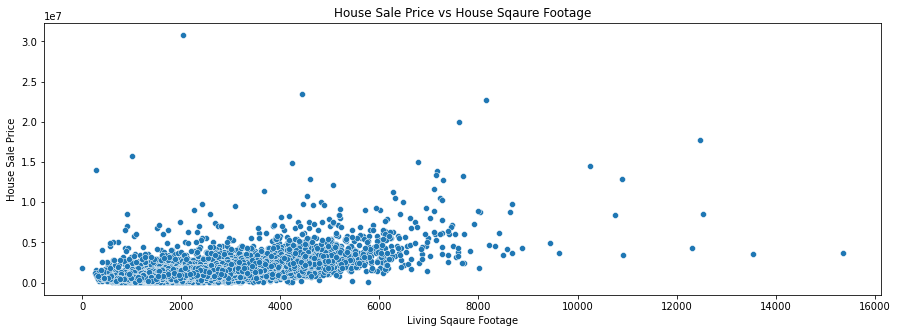

In [78]:
#Scatterplot of our baseline prediction that the larger the house, the higher the price

fig, ax = plt.subplots(figsize= (15, 5))

sns.scatterplot(data = final_kc_df, x = 'sqft_living', y='price',)

ax.set_xlabel("Living Sqaure Footage")
ax.set_ylabel("House Sale Price")
ax.set_title("House Sale Price vs House Sqaure Footage");

### First  Model

- Using only continuous variable data where we have integer or float values. 
- Not using `Science` Test Scores due to its Null values since Skykomish School District does not have scores.

In [79]:
# Prepare data
X = final_kc_df.drop(['price','waterfront','greenbelt','view','condition', 'grade', 'heat_source',\
                      'sewer_system', 'nuisance', 'DistrictName', 'Science'], axis=1)
y = final_kc_df['price']

In [80]:
# Test/Train Split: Train is 80% of Data, Test is 20% of Data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 42)

In [81]:
# Instantiate model
lr_simple_model = LinearRegression()

# Fit model
first_result = lr_simple_model.fit(X_train, y_train)

In [82]:
X_train.columns

Index(['bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot', 'floors',
       'sqft_above', 'sqft_basement', 'sqft_garage', 'sqft_patio', 'yr_built',
       'Zip Code', 'ELA', 'Math', 'District Test Score'],
      dtype='object')

In [83]:
# Retrieve estimated slope coefficient
first_result.coef_

array([-1.46579366e+05,  1.28660794e+05,  2.71140105e+02,  1.30730041e-01,
       -6.75387915e+04,  3.17179967e+02,  1.36036566e+02, -1.39166302e+02,
        2.22984075e+02, -2.72278103e+03,  7.44511474e+02,  3.98629808e+03,
        3.02912883e+04, -2.12646124e+04])

In [84]:
# Retrieve estimated y-intercept coefficient
first_result.intercept_

-68028501.90766136

In [85]:
#GIVES US OUR R**2
print("First Model Train:" , lr_simple_model.score(X_train, y_train))
print("First Model Test:" , lr_simple_model.score(X_test, y_test))

First Model Train: 0.48656816465982333
First Model Test: 0.5119899028835484


In [86]:
#MEAN ABSOLUTE ERROR
metrics.mean_absolute_error(y_test, lr_simple_model.predict(X_test))

352353.36107653956

It looks like our First Model explains 51% of the variance in House Sale Price but has the potential to be off by $352,353 in its predictions of house price.

### Modeling Iterations

Before we create another model we should look for Multicollinearity and ensure that our predictive variables are indeed independent.

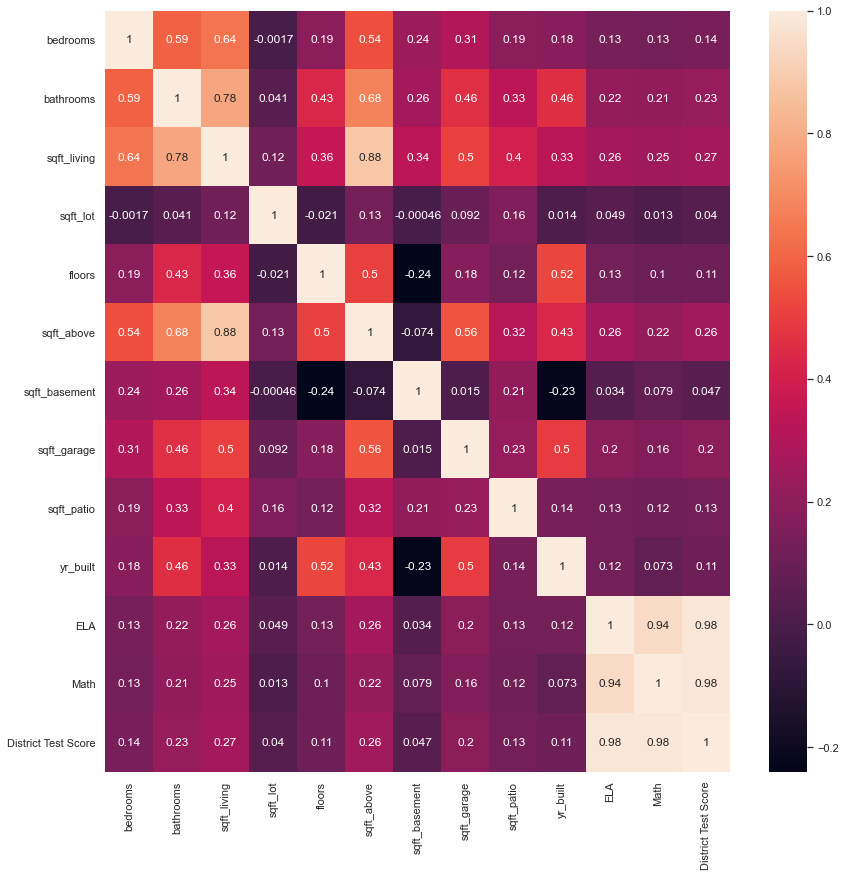

In [87]:
#Heatmap for Collinearity
sns.set(rc={'figure.figsize':(14, 14)})
sns.heatmap(X_train.corr(),annot=True);

In [88]:
#View Correlation between Independent Numeric Variables
X_train.corr()

,bedrooms,bathrooms,sqft_living,sqft_lot,floors,sqft_above,sqft_basement,sqft_garage,sqft_patio,yr_built,ELA,Math,District Test Score
bedrooms,1.000000,0.592982,0.636945,-0.001679,0.193921,0.541070,0.239439,0.306055,0.194604,0.181470,0.133511,0.131035,0.139570
bathrooms,0.592982,1.000000,0.780150,0.040826,0.429420,0.679883,0.263482,0.460655,0.333332,0.456992,0.223574,0.213246,0.225269
sqft_living,0.636945,0.780150,1.000000,0.121821,0.356021,0.881117,0.335551,0.504983,0.404422,0.328646,0.261937,0.246240,0.265761
sqft_lot,-0.001679,0.040826,0.121821,1.000000,-0.021275,0.132321,-0.000465,0.092211,0.161519,0.014009,0.048849,0.012596,0.040447
floors,0.193921,0.429420,0.356021,-0.021275,1.000000,0.504333,-0.240184,0.179701,0.124448,0.522993,0.125537,0.102862,0.109355
sqft_above,0.541070,0.679883,0.881117,0.132321,0.504333,1.000000,-0.074031,0.556861,0.320018,0.429417,0.261920,0.224180,0.258395
sqft_basement,0.239439,0.263482,0.335551,-0.000465,-0.240184,-0.074031,1.000000,0.015303,0.212245,-0.228894,0.034354,0.078852,0.046735
sqft_garage,0.306055,0.460655,0.504983,0.092211,0.179701,0.556861,0.015303,1.000000,0.229210,0.495794,0.196897,0.164113,0.199270
sqft_patio,0.194604,0.333332,0.404422,0.161519,0.124448,0.320018,0.212245,0.229210,1.000000,0.135812,0.128419,0.120195,0.132194
yr_built,0.181470,0.456992,0.328646,0.014009,0.522993,0.429417,-0.228894,0.495794,0.135812,1.000000,0.124317,0.073143,0.113178


`sqft_above` has a strong positive correlation with `sqft_living` so we should likely avoid using them both.

### Second Model

- Adding in categorical data to our model 
- Dropping `sqft_above` as it too closely correlates with `sqft_living`. 
- Again we are removing `Science` as it contains null values due to Skykomish School District not having scores.

In [89]:
final_kc_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 29171 entries, 0 to 29170
Data columns (total 25 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   price                29171 non-null  float64
 1   bedrooms             29171 non-null  int64  
 2   bathrooms            29171 non-null  float64
 3   sqft_living          29171 non-null  int64  
 4   sqft_lot             29171 non-null  int64  
 5   floors               29171 non-null  float64
 6   waterfront           29171 non-null  object 
 7   greenbelt            29171 non-null  object 
 8   nuisance             29171 non-null  object 
 9   view                 29171 non-null  object 
 10  condition            29171 non-null  object 
 11  grade                29171 non-null  object 
 12  heat_source          29171 non-null  object 
 13  sewer_system         29171 non-null  object 
 14  sqft_above           29171 non-null  int64  
 15  sqft_basement        29171 non-null 

In [90]:
#Dropping columns
final_kc_df2 = final_kc_df.drop(['sqft_above', 'nuisance', 'waterfront', 'greenbelt','view', 'Science'], axis = 1)

##### Preparing Data

In [91]:
#Defining variables for 2nd model
X = final_kc_df2.drop('price', axis=1)
y = final_kc_df2['price']

##### Train/Test Split
*Train 80% of Data, Test 20% of Data*

In [92]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 42)

##### Processing Data

In [93]:
#Train Data
y_train.shape

(23336,)

In [94]:
#Test Data
y_test.shape

(5835,)

##### Separate Continuous X Predictive Variables
*Train Data*

In [95]:
#Define our columns with numeric data- same as First Model
numeric_cols = ['bedrooms','bathrooms','sqft_living','sqft_lot','floors','sqft_basement',\
                           'sqft_garage','sqft_patio','yr_built','ELA','Math','Zip Code','District Test Score']

In [96]:
X_train_numeric = X_train[numeric_cols]

*Test Data*

In [97]:
X_test_numeric = X_test[numeric_cols]

##### Discrete Ordinal X Predictive Variables
*Train Data*

In [98]:
ord_cat_selector = ['condition', 'grade']
X_train_ord_cat_subset = X_train[ord_cat_selector]

In [99]:
X_train_ord_cat_subset['condition'].unique()

array(['Good', 'Average', 'Very Good', 'Poor', 'Fair'], dtype=object)

In [100]:
X_train_ord_cat_subset['grade'].unique()

array(['9 Better', '7 Average', '8 Good', '6 Low Average', '11 Excellent',
       '10 Very Good', '5 Fair', '4 Low', '3 Poor', '12 Luxury',
       '13 Mansion', '2 Substandard'], dtype=object)

In [101]:
# REPLACE WITH COLUMN'S UNIQUE VALUES IN ASCENDING ORDER --->
condition_list = ['Poor', 'Fair', 'Average', 'Good', 'Very Good'] 
grade_list = ['2 Substandard','3 Poor','4 Low', '5 Fair', '6 Low Average', '7 Average','8 Good','9 Better',\
              '10 Very Good','11 Excellent','12 Luxury','13 Mansion']

In [102]:
o_enc = OrdinalEncoder(categories = [condition_list, grade_list])
o_enc.fit(X_train_ord_cat_subset)

OrdinalEncoder(categories=[['Poor', 'Fair', 'Average', 'Good', 'Very Good'],
                           ['2 Substandard', '3 Poor', '4 Low', '5 Fair',
                            '6 Low Average', '7 Average', '8 Good', '9 Better',
                            '10 Very Good', '11 Excellent', '12 Luxury',
                            '13 Mansion']])

In [103]:
o_enc.transform(X_train_ord_cat_subset)

array([[3., 7.],
       [3., 5.],
       [3., 5.],
       ...,
       [3., 5.],
       [4., 5.],
       [2., 6.]])

In [104]:
X_train_ord = pd.DataFrame(o_enc.transform(X_train_ord_cat_subset),
                        columns = X_train_ord_cat_subset.columns)

In [105]:
X_train_ord.head()

,condition,grade
0,3.0,7.0
1,3.0,5.0
2,3.0,5.0
3,2.0,6.0
4,2.0,6.0


*Test Data*

In [106]:
X_test_ord_cat_subset = X_test[ord_cat_selector]

In [107]:
X_test_ord = pd.DataFrame(o_enc.transform(X_test_ord_cat_subset),
                        columns = X_test_ord_cat_subset.columns)

##### Discrete Nominal X Predictive Variables
*Train Data*

In [108]:
onehot_enc = OneHotEncoder(sparse = False, handle_unknown = 'ignore')

In [109]:
nominal_cols = ['heat_source', 'sewer_system', 'DistrictName']
onehot_enc.fit_transform(X_train[nominal_cols])

array([[0., 0., 1., ..., 0., 0., 0.],
       [1., 0., 0., ..., 0., 0., 0.],
       [0., 0., 1., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 1., ..., 0., 0., 0.],
       [1., 0., 0., ..., 0., 0., 0.]])

In [110]:
X_train_nom_trans = onehot_enc.fit_transform(X_train[nominal_cols])
X_train_nom_trans.shape

(23336, 29)

In [111]:
cols = onehot_enc.get_feature_names()

In [112]:
X_train_nom = pd.DataFrame(X_train_nom_trans, columns = cols)
X_train_nom.head()

,x0_Electricity,x0_Electricity/Solar,x0_Gas,x0_Gas/Solar,x0_Oil,x0_Oil/Solar,x0_Other,x1_PRIVATE,x1_PRIVATE RESTRICTED,x1_PUBLIC,x1_PUBLIC RESTRICTED,x2_Auburn School District,x2_Bellevue School District,x2_Enumclaw School District,x2_Federal Way School District,x2_Fife School District,x2_Highline School District,x2_Issaquah School District,x2_Mercer Island School District,x2_Northshore School District,x2_Renton School District,x2_Riverview School District,x2_Seattle School District No. 1,x2_Shoreline School District,x2_Skykomish School District,x2_Snoqualmie Valley School District,x2_Tahoma School District,x2_Tukwila School District,x2_Vashon Island School District
0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
1,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


*Test Data*

In [113]:
X_test_nom_trans = onehot_enc.transform(X_test[nominal_cols])
X_test_nom_trans.shape

(5835, 29)

In [114]:
X_test_nom = pd.DataFrame(X_test_nom_trans, columns = cols)

##### Combine Discrete/Categorical X/ Predictive Variables

In [115]:
#combine all catergorical variables

X_train_cat_df = pd.concat([X_train_ord,X_train_nom],axis = 1)
X_train_cat_df

,condition,grade,x0_Electricity,x0_Electricity/Solar,x0_Gas,x0_Gas/Solar,x0_Oil,x0_Oil/Solar,x0_Other,x1_PRIVATE,x1_PRIVATE RESTRICTED,x1_PUBLIC,x1_PUBLIC RESTRICTED,x2_Auburn School District,x2_Bellevue School District,x2_Enumclaw School District,x2_Federal Way School District,x2_Fife School District,x2_Highline School District,x2_Issaquah School District,x2_Mercer Island School District,x2_Northshore School District,x2_Renton School District,x2_Riverview School District,x2_Seattle School District No. 1,x2_Shoreline School District,x2_Skykomish School District,x2_Snoqualmie Valley School District,x2_Tahoma School District,x2_Tukwila School District,x2_Vashon Island School District
0,3.0,7.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
1,3.0,5.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
2,3.0,5.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
3,2.0,6.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,2.0,6.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23331,3.0,6.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
23332,4.0,5.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
23333,3.0,5.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
23334,4.0,5.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


*Test Data*

In [116]:
X_test_cat_df = pd.concat([X_test_ord,X_test_nom],axis = 1)

#### Combine Continuous and Discrete X/ Predictive Variables

In [117]:
#Train Data - Combine all processed X Variables
X_process_train = pd.concat([X_train_numeric.reset_index(),X_train_cat_df],axis = 1)

In [118]:
X_process_train.head()

,index,bedrooms,bathrooms,sqft_living,sqft_lot,floors,sqft_basement,sqft_garage,sqft_patio,yr_built,ELA,Math,Zip Code,District Test Score,condition,grade,x0_Electricity,x0_Electricity/Solar,x0_Gas,x0_Gas/Solar,x0_Oil,x0_Oil/Solar,x0_Other,x1_PRIVATE,x1_PRIVATE RESTRICTED,x1_PUBLIC,x1_PUBLIC RESTRICTED,x2_Auburn School District,x2_Bellevue School District,x2_Enumclaw School District,x2_Federal Way School District,x2_Fife School District,x2_Highline School District,x2_Issaquah School District,x2_Mercer Island School District,x2_Northshore School District,x2_Renton School District,x2_Riverview School District,x2_Seattle School District No. 1,x2_Shoreline School District,x2_Skykomish School District,x2_Snoqualmie Valley School District,x2_Tahoma School District,x2_Tukwila School District,x2_Vashon Island School District
0,28186,4,2.5,2590,14468,1.0,960,530,240,1977,75.3,64.6,98074,68.33,3.0,7.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
1,4121,4,2.0,1980,7200,1.0,990,0,110,1946,62.7,51.6,98115,54.27,3.0,5.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
2,9733,3,1.5,940,5625,1.5,670,0,160,1926,62.7,51.6,98118,54.27,3.0,5.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
3,20141,3,2.5,2010,4712,2.0,0,450,140,2012,56.7,40.1,98038,48.87,2.0,6.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,27796,4,3.0,2590,7213,2.0,0,640,96,2001,46.2,30.8,98001,38.67,2.0,6.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [119]:
X_process_train.shape

(23336, 45)

*Test Data*

In [120]:
X_process_test = pd.concat([X_test_numeric.reset_index(),X_test_cat_df],axis = 1)

#### Scale the Data

In [121]:
# Now we'll apply it to our data by using the .fit() (calculates stds and means) and .transform() methods.
ss = StandardScaler()
#Train Data
ss.fit(X_process_train)
X_standard_process_train = ss.transform(X_process_train)

#Test Data
X_standard_process_test = ss.transform(X_process_test)

#### Creating, Fitting, and Running the Model

In [122]:
# Instantiate model
lr_simple_model = LinearRegression()

# Fit model
result = lr_simple_model.fit(X_standard_process_train, y_train)

In [123]:
# Retrieve estimated slope coefficient
result.coef_

array([-5.40237549e+03, -1.10982818e+05,  7.21482592e+04,  4.13902512e+05,
        3.46241800e+04, -4.11260979e+04, -4.40266016e+04, -8.61921172e+03,
        3.62051863e+04, -1.05621551e+05, -5.83092241e+15,  1.39399129e+16,
       -3.51875548e+04, -2.38202209e+16,  1.24475769e+04,  1.81524276e+05,
        1.53169831e+16,  1.62276786e+15,  1.75317966e+16,  2.15586275e+15,
        1.13243094e+16,  4.95353730e+14,  1.07925134e+15, -2.85820540e+15,
       -1.05017342e+14, -2.86023460e+15, -7.42616573e+13,  8.80574131e+15,
        1.84089738e+16,  1.80529942e+16,  5.97320060e+15,  1.01073662e+16,
        1.04354533e+16,  1.67563272e+16,  1.84808741e+16,  1.81659720e+16,
        8.01054786e+15,  1.67643486e+16,  2.89583325e+16,  1.70311696e+16,
        1.09038813e+16,  1.41009466e+16,  2.24092662e+16,  6.12298375e+15,
        6.38392334e+15])

In [124]:
# Retrieve estimated y-intercept coefficient
result.intercept_

1109279.1206345283

In [125]:
#GIVES US OUR R**2
print("Second Model Train:" , lr_simple_model.score(X_standard_process_train, y_train))
print("Second Model Test:" , lr_simple_model.score(X_standard_process_test, y_test))

Second Model Train: 0.5562100896792812
Second Model Test: 0.5927505584989258


It looks like our Second Model did better than the First and now explains 59% of the variance in House Sale Price.

### Third Model

- Limited continuous variables to top three most correlated numeric variables (`bathrooms`,`sqft_living`,`sqft_patio`)

In [126]:
# Prepare data
X = final_kc_df.drop('price', axis=1)
y = final_kc_df['price']

In [127]:
# Test/Train Split - Train 80% of Data, Test 20% of Data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 42)

#### Continuous X/ Predictive Variables

In [128]:
#Separate Continuous X Variables from rest of X Variables

*Train Data*

In [129]:
#Define our columns with numeric data
numeric_cols = ['bathrooms','sqft_living','sqft_patio']

In [130]:
#Define our numeric training data
X_train_numeric = X_train[numeric_cols]

*Test Data*

In [131]:
#Define our numeric testing data
X_test_numeric = X_test[numeric_cols]

#### Discrete X/ Predictive Variables

#### Discrete Ordinal X/ Predictive Variables

In [132]:
#Separate Discrete Ordinal X Variables from rest of X Variables

*Train Data*

In [133]:
#Define our columns with ordinal data and create train data subset
ord_cat_selector = ['condition','grade']
X_train_ord_cat_subset = X_train[ord_cat_selector]

In [134]:
#Fit ordinal train data
o_enc = OrdinalEncoder(categories = [condition_list, grade_list])
o_enc.fit(X_train_ord_cat_subset)

OrdinalEncoder(categories=[['Poor', 'Fair', 'Average', 'Good', 'Very Good'],
                           ['2 Substandard', '3 Poor', '4 Low', '5 Fair',
                            '6 Low Average', '7 Average', '8 Good', '9 Better',
                            '10 Very Good', '11 Excellent', '12 Luxury',
                            '13 Mansion']])

In [135]:
#Transform ordinal train data
o_enc.transform(X_train_ord_cat_subset)

array([[3., 7.],
       [3., 5.],
       [3., 5.],
       ...,
       [3., 5.],
       [4., 5.],
       [2., 6.]])

In [136]:
#Turn ordinal train data back into a dataframe
X_train_ord = pd.DataFrame(o_enc.transform(X_train_ord_cat_subset),
                        columns = X_train_ord_cat_subset.columns)

*Test Data*

In [137]:
#Define ordinal test subset
X_test_ord_cat_subset = X_test[ord_cat_selector]

In [138]:
#Transform ordinal test data
o_enc.transform(X_test_ord_cat_subset)

array([[2., 7.],
       [2., 6.],
       [3., 5.],
       ...,
       [2., 6.],
       [4., 4.],
       [2., 5.]])

In [139]:
#Turn ordinal test data back into a dataframe
X_test_ord = pd.DataFrame(o_enc.transform(X_test_ord_cat_subset),
                        columns = X_test_ord_cat_subset.columns)

#### Discrete Nominal  X/ Predictive Variables

In [140]:
#Separate Discrete Nominal X Variables from rest of X Variables

*Train Data*

In [141]:
#Define nominal columns
nominal_cols = ['heat_source','sewer_system','yr_built','Zip Code']

In [142]:
#Fit and Transform nominal train data
X_train_nom_trans = onehot_enc.fit_transform(X_train[nominal_cols])

In [143]:
#View nominal train data shape
X_train_nom_trans.shape

(23336, 211)

In [144]:
#Get columns names
cols = onehot_enc.get_feature_names()

In [145]:
#Turn nominal train data back into a dataframe
X_train_nom = pd.DataFrame(X_train_nom_trans, columns = cols)
#Preview nominal train dataframe
X_train_nom.head()

,x0_Electricity,x0_Electricity/Solar,x0_Gas,x0_Gas/Solar,x0_Oil,x0_Oil/Solar,x0_Other,x1_PRIVATE,x1_PRIVATE RESTRICTED,x1_PUBLIC,x1_PUBLIC RESTRICTED,x2_1900,x2_1901,x2_1902,x2_1903,x2_1904,x2_1905,x2_1906,x2_1907,x2_1908,x2_1909,x2_1910,x2_1911,x2_1912,x2_1913,x2_1914,x2_1915,x2_1916,x2_1917,x2_1918,x2_1919,x2_1920,x2_1921,x2_1922,x2_1923,x2_1924,x2_1925,x2_1926,x2_1927,x2_1928,x2_1929,x2_1930,x2_1931,x2_1932,x2_1933,x2_1934,x2_1935,x2_1936,x2_1937,x2_1938,x2_1939,x2_1940,x2_1941,x2_1942,x2_1943,x2_1944,x2_1945,x2_1946,x2_1947,x2_1948,x2_1949,x2_1950,x2_1951,x2_1952,x2_1953,x2_1954,x2_1955,x2_1956,x2_1957,x2_1958,x2_1959,x2_1960,x2_1961,x2_1962,x2_1963,x2_1964,x2_1965,x2_1966,x2_1967,x2_1968,x2_1969,x2_1970,x2_1971,x2_1972,x2_1973,x2_1974,x2_1975,x2_1976,x2_1977,x2_1978,x2_1979,x2_1980,x2_1981,x2_1982,x2_1983,x2_1984,x2_1985,x2_1986,x2_1987,x2_1988,x2_1989,x2_1990,x2_1991,x2_1992,x2_1993,x2_1994,x2_1995,x2_1996,x2_1997,x2_1998,x2_1999,x2_2000,x2_2001,x2_2002,x2_2003,x2_2004,x2_2005,x2_2006,x2_2007,x2_2008,x2_2009,x2_2010,x2_2011,x2_2012,x2_2013,x2_2014,x2_2015,x2_2016,x2_2017,x2_2018,x2_2019,x2_2020,x2_2021,x2_2022,x3_98001,x3_98002,x3_98003,x3_98004,x3_98005,x3_98006,x3_98007,x3_98008,x3_98010,x3_98011,x3_98014,x3_98019,x3_98022,x3_98023,x3_98024,x3_98027,x3_98028,x3_98029,x3_98030,x3_98031,x3_98032,x3_98033,x3_98034,x3_98038,x3_98039,x3_98040,x3_98042,x3_98045,x3_98047,x3_98050,x3_98051,x3_98052,x3_98053,x3_98055,x3_98056,x3_98057,x3_98058,x3_98059,x3_98065,x3_98070,x3_98072,x3_98074,x3_98075,x3_98077,x3_98092,x3_98102,x3_98103,x3_98105,x3_98106,x3_98107,x3_98108,x3_98109,x3_98112,x3_98115,x3_98116,x3_98117,x3_98118,x3_98119,x3_98122,x3_98125,x3_98126,x3_98133,x3_98136,x3_98144,x3_98146,x3_98148,x3_98155,x3_98166,x3_98168,x3_98177,x3_98178,x3_98188,x3_98198,x3_98199,x3_98224,x3_98288,x3_98354
0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0

*Test Data*

In [146]:
# Transform nominal test data
X_test_nom_trans = onehot_enc.transform(X_test[nominal_cols])

In [147]:
#View nominal test data shape
X_test_nom_trans.shape

(5835, 211)

In [148]:
#Turn nominal test data back into a dataframe
X_test_nom = pd.DataFrame(X_test_nom_trans, columns = cols)

#### Combine Discrete/Categorical X/ Predictive Variables

*Train Data*

In [149]:
#Concatinating the ordinal and nominal training dataframes
X_train_cat = pd.concat([X_train_ord, X_train_nom],axis = 1)

*Test Data*

In [150]:
#Concatinating the ordinal and nominal testing dataframes
X_test_cat = pd.concat([X_test_ord, X_test_nom],axis = 1)

#### Combine Continuous and Discrete X/ Predictive Variables

*Train Data*

In [151]:
#Resetting index so the data lines up
X_process_train = pd.concat([X_train_numeric.reset_index(),X_train_cat],axis = 1)
#Dropping the old index column
X_process_train = X_process_train.drop('index', axis = 1)

*Test Data*

In [152]:
#Resetting index so the data lines up
X_process_test = pd.concat([X_test_numeric.reset_index(),X_test_cat],axis = 1)
#Dropping the old index column
X_process_test = X_process_test.drop('index', axis = 1)

#### Scale the Data

*Train Data*

In [153]:
#Fit and Transforming Train Data with our StandardScaler object
ss.fit(X_process_train)
X_standard_process_train = ss.transform(X_process_train)

*Test Data*

In [154]:
# Transforming Test Data with our StandardScaler object
X_standard_process_test = ss.transform(X_process_test)

### Creating, Fitting, and Running the Model

In [155]:
# Instantiate model
lr_simple_model = LinearRegression()

# Fit model
third_result = lr_simple_model.fit(X_standard_process_train, y_train)

In [156]:
# Retrieve estimated slope coefficient
third_result.coef_

array([ 2.20589163e+04,  3.14538000e+05,  3.93206507e+04,  2.21779647e+04,
        1.79035906e+05, -3.40854905e+15, -3.61120974e+14, -3.90142029e+15,
       -4.79752695e+14, -2.52004351e+15, -1.10233032e+14, -2.40170083e+14,
        1.70595936e+17,  6.26810509e+15,  1.70717052e+17,  4.43240957e+15,
        8.44645110e+14,  4.56827368e+14,  4.22976249e+14,  5.59328920e+14,
        6.57063621e+14,  7.21656414e+14,  7.11302898e+14,  7.41924956e+14,
        9.55517808e+14,  8.08825302e+14,  1.02265074e+15,  7.46905085e+14,
        7.85595769e+14,  6.62689521e+14,  7.61647601e+14,  7.00794611e+14,
        7.80865714e+14,  5.25037226e+14,  1.11562826e+15,  8.04233869e+14,
        9.43854204e+14,  7.31861728e+14,  8.04233869e+14,  8.74765915e+14,
        9.24080856e+14,  1.08554484e+15,  1.10901560e+15,  9.67037770e+14,
        1.08214914e+15,  8.40252478e+14,  8.31396438e+14,  6.45663291e+14,
        5.78923153e+14,  4.04986299e+14,  4.95887866e+14,  4.80646733e+14,
        6.34056000e+14,  

In [157]:
# Retrieve estimated y-intercept coefficient
third_result.intercept_

1109245.485031429

In [158]:
#GIVES US OUR R**2
print("Third Model Train:" , lr_simple_model.score(X_standard_process_train, y_train))
print("Third Model Test:" , lr_simple_model.score(X_standard_process_test, y_test))

Third Model Train: 0.6036204670687679
Third Model Test: 0.6409117222406189


It looks like our Third Model jumped quite a bit and now explains 64% of the variance in House Sale Price.

### Final Model

- Log transforming the `price` data
- Adding in binary variables (`waterfront`, `greenbelt`,`nuissance`)
- Adding the ordinal variable `view`
- Limited the nominal variables to `Zip Code` and `heat_source`

In [159]:
# Prepare data
X = final_kc_df.drop('price', axis=1)
y = final_kc_df['price']

In [160]:
# Test/Train Split - Train 80% of Data, Test 20% of Data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 42)

### Processing the Data

*Y Train Data*

In [161]:
y_train = np.log(y_train)

*Y Test Data*

In [162]:
y_test = np.log(y_test)

#### Binary Variables

*Train Data*

In [163]:
#Replacing YES and NO with numeric values
X_train['waterfront'] = X_train['waterfront'].map({"YES": 1,"NO": 0})
X_train['greenbelt'] = X_train['greenbelt'].map({"YES": 1,"NO": 0})
X_train['nuisance'] = X_train['nuisance'].map({"YES": 1,"NO": 0})

<ipython-input-163-61f1cfc502a6>:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-163-61f1cfc502a6>:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-163-61f1cfc502a6>:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [164]:
#Checking that YES & NO are replaced by 1 and 0 respectively
X_train[['waterfront','greenbelt','nuisance']]

,waterfront,greenbelt,nuisance
28186,0,0,0
4121,0,0,1
9733,0,0,0
20141,0,0,0
27796,0,0,0
...,...,...,...
21575,0,0,0
5390,0,0,0
860,0,0,0
15795,0,0,0


*Test Data*

In [165]:
#Replacing YES and NO with numeric values
X_test['waterfront'] = X_test['waterfront'].map({"YES": 1,"NO": 0})
X_test['greenbelt'] = X_test['greenbelt'].map({"YES": 1,"NO": 0})
X_test['nuisance'] = X_test['nuisance'].map({"YES": 1,"NO": 0})

<ipython-input-165-f35eee69c2f8>:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-165-f35eee69c2f8>:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-165-f35eee69c2f8>:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



#### Continuous X/ Predictive Variables

In [166]:
#Separate Continuous X Variables from rest of X Variables

*Train Data*

In [167]:
#Define our columns with numeric data
numeric_cols = ['bathrooms','sqft_living','sqft_patio','waterfront','greenbelt','nuisance']

In [168]:
#Define our numeric training data
X_train_numeric = X_train[numeric_cols]

*Test Data*

In [169]:
#Define our numeric testing data
X_test_numeric = X_test[numeric_cols]

#### Discrete X/ Predictive Variables

#### Discrete Ordinal X/ Predictive Variables

In [170]:
#Separate Discrete Ordinal X Variables from rest of X Variables

*Train Data*

In [171]:
#Define our columns with ordinal data and create train data subset
ord_cat_selector = ['condition','grade', 'view']
X_train_ord_cat_subset = X_train[ord_cat_selector]

In [172]:
#View unique values in our ordinal columns
X_train_ord_cat_subset['condition'].unique()

array(['Good', 'Average', 'Very Good', 'Poor', 'Fair'], dtype=object)

In [173]:
X_train_ord_cat_subset['grade'].unique()

array(['9 Better', '7 Average', '8 Good', '6 Low Average', '11 Excellent',
       '10 Very Good', '5 Fair', '4 Low', '3 Poor', '12 Luxury',
       '13 Mansion', '2 Substandard'], dtype=object)

In [174]:
X_train_ord_cat_subset['view'].unique()

array(['NONE', 'FAIR', 'AVERAGE', 'EXCELLENT', 'GOOD'], dtype=object)

In [175]:
# REPLACE WITH COLUMN'S UNIQUE VALUES IN ASCENDING ORDER --->
condition_list = ['Poor', 'Fair', 'Average', 'Good', 'Very Good'] 
grade_list = ['2 Substandard','3 Poor','4 Low', '5 Fair', '6 Low Average', '7 Average','8 Good','9 Better',\
              '10 Very Good','11 Excellent','12 Luxury','13 Mansion']
view_list = ['NONE', 'FAIR', 'AVERAGE', 'EXCELLENT', 'GOOD']

In [176]:
#Fit ordinal train data
o_enc = OrdinalEncoder(categories = [condition_list, grade_list, view_list])
o_enc.fit(X_train_ord_cat_subset)

OrdinalEncoder(categories=[['Poor', 'Fair', 'Average', 'Good', 'Very Good'],
                           ['2 Substandard', '3 Poor', '4 Low', '5 Fair',
                            '6 Low Average', '7 Average', '8 Good', '9 Better',
                            '10 Very Good', '11 Excellent', '12 Luxury',
                            '13 Mansion'],
                           ['NONE', 'FAIR', 'AVERAGE', 'EXCELLENT', 'GOOD']])

In [177]:
#Transform ordinal train data
o_enc.transform(X_train_ord_cat_subset)

array([[3., 7., 0.],
       [3., 5., 0.],
       [3., 5., 1.],
       ...,
       [3., 5., 2.],
       [4., 5., 0.],
       [2., 6., 0.]])

In [178]:
#Turn ordinal train data back into a dataframe
X_train_ord = pd.DataFrame(o_enc.transform(X_train_ord_cat_subset),
                        columns = X_train_ord_cat_subset.columns)

In [179]:
#Preview ordinal data to confirm numerical values have replaced unique values
X_train_ord.head()

,condition,grade,view
0,3.0,7.0,0.0
1,3.0,5.0,0.0
2,3.0,5.0,1.0
3,2.0,6.0,0.0
4,2.0,6.0,0.0


*Test Data*

In [180]:
#Define ordinal test subset
X_test_ord_cat_subset = X_test[ord_cat_selector]

In [181]:
#Transform ordinal test data
o_enc.transform(X_test_ord_cat_subset)

array([[2., 7., 0.],
       [2., 6., 0.],
       [3., 5., 0.],
       ...,
       [2., 6., 0.],
       [4., 4., 0.],
       [2., 5., 0.]])

In [182]:
#Turn ordinal test data back into a dataframe
X_test_ord = pd.DataFrame(o_enc.transform(X_test_ord_cat_subset),
                        columns = X_test_ord_cat_subset.columns)

#### Discrete Nominal  X/ Predictive Variables

In [183]:
#Separate Discrete Nominal X Variables from rest of X Variables

In [184]:
onehot_enc = OneHotEncoder(drop = 'first', sparse = False)

*Train Data*

In [185]:
#Define nominal columns
nominal_cols = ['Zip Code', 'heat_source']

In [186]:
#Fit and Transform nominal train data
X_train_nom_trans = onehot_enc.fit_transform(X_train[nominal_cols])

In [187]:
#View nominal train data shape
X_train_nom_trans.shape

(23336, 82)

In [188]:
#Get columns names
cols = onehot_enc.get_feature_names()

In [189]:
#Turn nominal train data back into a dataframe
X_train_nom = pd.DataFrame(X_train_nom_trans, columns = cols)
#Preview nominal train dataframe
X_train_nom.head()

,x0_98002,x0_98003,x0_98004,x0_98005,x0_98006,x0_98007,x0_98008,x0_98010,x0_98011,x0_98014,x0_98019,x0_98022,x0_98023,x0_98024,x0_98027,x0_98028,x0_98029,x0_98030,x0_98031,x0_98032,x0_98033,x0_98034,x0_98038,x0_98039,x0_98040,x0_98042,x0_98045,x0_98047,x0_98050,x0_98051,x0_98052,x0_98053,x0_98055,x0_98056,x0_98057,x0_98058,x0_98059,x0_98065,x0_98070,x0_98072,x0_98074,x0_98075,x0_98077,x0_98092,x0_98102,x0_98103,x0_98105,x0_98106,x0_98107,x0_98108,x0_98109,x0_98112,x0_98115,x0_98116,x0_98117,x0_98118,x0_98119,x0_98122,x0_98125,x0_98126,x0_98133,x0_98136,x0_98144,x0_98146,x0_98148,x0_98155,x0_98166,x0_98168,x0_98177,x0_98178,x0_98188,x0_98198,x0_98199,x0_98224,x0_98288,x0_98354,x1_Electricity/Solar,x1_Gas,x1_Gas/Solar,x1_Oil,x1_Oil/Solar,x1_Other
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0


*Test Data*

In [190]:
# Transform nominal test data
X_test_nom_trans = onehot_enc.transform(X_test[nominal_cols])

In [191]:
#View nominal test data shape
X_test_nom_trans.shape

(5835, 82)

In [192]:
#Turn nominal test data back into a dataframe
X_test_nom = pd.DataFrame(X_test_nom_trans, columns = cols)

#### Combine Discrete/Categorical X/ Predictive Variables

*Train Data*

In [193]:
#Concatinating the ordinal and nominal training dataframes
X_train_cat = pd.concat([X_train_ord, X_train_nom],axis = 1)

*Test Data*

In [194]:
#Concatinating the ordinal and nominal testing dataframes
X_test_cat = pd.concat([X_test_ord, X_test_nom],axis = 1)

#### Combine Continuous and Discrete X/ Predictive Variables

*Train Data - Combine all processed X Variables*

In [195]:
#Resetting index so the data lines up
X_process_train = pd.concat([X_train_numeric.reset_index(),X_train_cat],axis = 1)
#Dropping the old index column
X_process_train = X_process_train.drop('index', axis = 1)

In [196]:
#Checking the new shape of our combined dataframe
X_process_train.shape

(23336, 91)

*Test Data - Combine all processed X Variables*

In [197]:
#Resetting index so the data lines up
X_process_test = pd.concat([X_test_numeric.reset_index(),X_test_cat],axis = 1)
#Dropping the old index column
X_process_test = X_process_test.drop('index', axis = 1)

#### Scale the Data

In [198]:
# Create a StandardScaler object to scale data
ss = StandardScaler()

*Train Data*

In [199]:
#Fit and Transforming Train Data with our StandardScaler object
ss.fit(X_process_train)
X_standard_process_train = ss.transform(X_process_train)

*Test Data*

In [200]:
# Transforming Test Data with our StandardScaler object
X_standard_process_test = ss.transform(X_process_test)

### Creating, Fitting, and Running the Model

In [201]:
# Instantiate model
lr_simple_model = LinearRegression()

# Fit model
final_result = lr_simple_model.fit(X_standard_process_train, y_train)

In [202]:
# Retrieve estimated slope coefficient
final_result.coef_

array([ 2.01805549e-02,  1.86888897e-01,  1.02812227e-02,  4.45339957e-02,
        7.59969005e-03, -1.77347220e-02,  4.21341655e-02,  1.06698651e-01,
        4.32551374e-02, -1.08668233e-02, -4.43754536e-03,  1.21545353e-01,
        6.75824541e-02,  9.45059455e-02,  5.31765893e-02,  8.91508719e-02,
        1.32720552e-02,  5.29467780e-02,  2.24283436e-02,  3.44653276e-02,
        2.66514240e-03, -5.92277160e-03,  3.74762652e-02,  6.24629826e-02,
        5.28029867e-02,  7.04014432e-02,  2.80109705e-03,  4.80601025e-03,
        5.05996388e-05,  1.37276981e-01,  9.76219883e-02,  3.46786964e-02,
        6.60317424e-02,  9.98955938e-02,  8.72779854e-03,  4.37930653e-02,
       -1.71380781e-03,  4.56628318e-03,  1.07043572e-02,  1.07423335e-01,
        7.77570791e-02,  1.07833107e-02,  4.26115436e-02,  9.52616213e-03,
        2.07787731e-02,  4.99909920e-02,  4.74253487e-02,  2.59524549e-02,
        6.27158275e-02,  8.20082609e-02,  8.51880876e-02,  5.43706389e-02,
        2.25934812e-03,  

In [203]:
# Retrieve estimated y-intercept coefficient
final_result.intercept_

13.736769847323679

In [204]:
#GIVES US OUR R**2
print("Final Model Train:" , lr_simple_model.score(X_standard_process_train, y_train))
print("Final Model Test:" , lr_simple_model.score(X_standard_process_test, y_test))

Final Model Train: 0.6958854232672603
Final Model Test: 0.7050360221060515


## Evaluation

In [205]:
#MEAN ABSOLUTE ERROR
metrics.mean_absolute_error(np.exp(y_test),np.exp(lr_simple_model.predict(X_standard_process_test)))

225622.43817210145

With these parameters, our Final Model jumped a bit more and now explains 70.5% of the variance in House Sale Price. Our mean absolute error is much better than our First Model decreasing from $\$352,353 to $\$225,622.

In [206]:
#Make our predictions based on our model
y_hat = lr_simple_model.predict(X_standard_process_test)
y_hat 

array([14.25481866, 13.94237704, 13.51101024, ..., 13.57933445,
       13.03906713, 13.75204632])

In [207]:
# Calculate our residuals
resid = (y_test - y_hat)

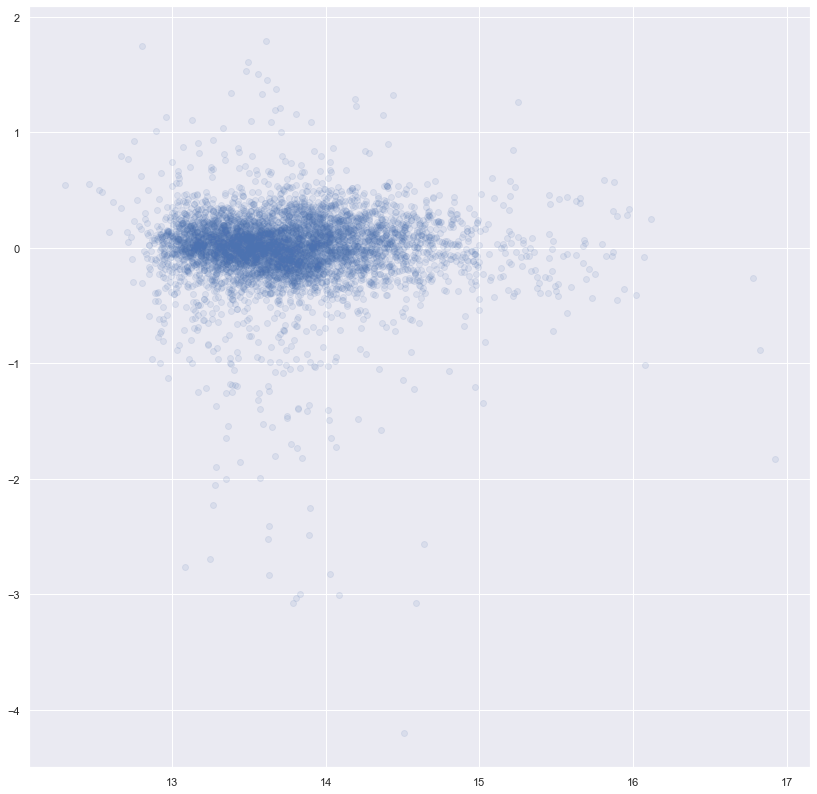

In [208]:
#Visualize our residuals on a scatter plot
fig, ax = plt.subplots()
ax.scatter(x=y_hat,y=resid, alpha=0.1);

In [209]:
#Create a dataframe of value to our stakeholders including our test predictive variables (X_test),
# predicted prices (y_hat), and test target variables (y_test aka 'price')

stake_df = pd.concat([X_test.reset_index().drop('index',1),\
                      pd.Series(y_hat),\
                      y_test.reset_index()],1).rename(columns ={0:'pred_price'})

In [210]:
#Undo our log transformation
stake_df['pred_price'] =np.exp(stake_df['pred_price'])
stake_df['price'] =np.exp(stake_df['price'])

In [211]:
#Create a new column containg the difference in price  and predicted price
stake_df['dif'] =  stake_df['pred_price'] - stake_df['price']

In [212]:
stake_df.head()

,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,greenbelt,nuisance,view,condition,grade,heat_source,sewer_system,sqft_above,sqft_basement,sqft_garage,sqft_patio,yr_built,Zip Code,DistrictName,ELA,Math,Science,District Test Score,pred_price,index,price,dif
0,4,3.0,3390,7181,2.0,0,0,0,NONE,Average,9 Better,Gas,PUBLIC,3390,0,810,50,2011,98072,Northshore School District,72.0,59.6,55.8,62.47,1.551633e+06,26269,1410000.0,141633.282163
1,4,2.0,2120,5000,1.0,0,0,0,NONE,Average,8 Good,Gas,PUBLIC,2120,0,0,0,1955,98107,Seattle School District No. 1,62.7,51.6,48.5,54.27,1.135265e+06,5556,950000.0,185265.427799
2,3,2.0,1630,7614,1.0,0,0,0,NONE,Good,7 Average,Gas,PUBLIC,1630,0,460,0,1967,98056,Issaquah School District,76.0,69.6,63.2,69.60,7.374918e+05,24843,790000.0,-52508.208933
3,3,2.5,1690,6405,2.0,0,0,0,NONE,Good,7 Average,Gas,PUBLIC,1690,0,620,330,1992,98038,Enumclaw School District,56.7,40.1,49.8,48.87,6.737435e+05,19243,626000.0,47743.480959
4,3,2.5,2480,5038,2.0,0,1,0,NONE,Average,7 Average,Gas,PUBLIC,2480,0,440,300,2005,98065,Riverview School District,69.0,54.7,54.5,59.40,1.012991e+06,18406,1000000.0,12990.698411


In [213]:
#Filter for where homes are undervalued (predicted price is higher than actual price)
stake_df.sort_values(by = 'dif', ascending = False).loc[stake_df['dif'] > 0]['DistrictName'].value_counts()

Seattle School District No. 1        726
Tahoma School District               239
Enumclaw School District             229
Highline School District             224
Northshore School District           161
Bellevue School District             136
Shoreline School District            134
Mercer Island School District        132
Riverview School District            126
Issaquah School District             126
Fife School District                  97
Snoqualmie Valley School District     96
Auburn School District                88
Federal Way School District           69
Tukwila School District               68
Renton School District                67
Skykomish School District             32
Vashon Island School District         16
Name: DistrictName, dtype: int64

Looks like we have the most undervalued homes in Seattle School District No. 1, but let's filter for homes that meet our stakeholder's needs. 

In [214]:
undervalued_famhouse_df = stake_df.sort_values(by = 'dif', ascending = False).loc[(stake_df['dif'] > 0) & \
                                                                        (stake_df['bedrooms'] >= 4) & \
                                                                         (stake_df['nuisance'] == 0)]

In [215]:
undervalued_famhouse_df['DistrictName'].value_counts()

Seattle School District No. 1        137
Enumclaw School District             107
Tahoma School District               106
Mercer Island School District         73
Northshore School District            66
Highline School District              62
Snoqualmie Valley School District     61
Issaquah School District              59
Bellevue School District              58
Fife School District                  43
Riverview School District             39
Auburn School District                36
Federal Way School District           35
Shoreline School District             30
Renton School District                24
Tukwila School District               19
Skykomish School District             16
Vashon Island School District          3
Name: DistrictName, dtype: int64

In [216]:
#Plot undervalued homes by School District Test Scores

px.scatter(undervalued_famhouse_df, x = 'District Test Score', y= 'dif',\
           hover_name = "DistrictName", hover_data= ['price'],\
          labels = {'dif':'Valuation Difference (in $)'},\
           title = "House Valuation Difference by School District")

## Conclusions

We would recommend that cohabiting single mothers looking to co-purchase a family home in King County, Washington consider looking in the Mercer Island School District as there are a considerable number of undervalued family houses and the schools have the best test scores in the county.

Our analysis was limited to data from house sales in King County, Washington and so might not be applicable to other localities as other predictive variables may be more influential on housing prices in that particular area.

Finally, we would continue working on simplifying our model to be able to specify which house features are most important to the overall value of a house. 